In [752]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn import metrics   
import matplotlib.style


In [753]:
ca= pd.read_excel('compactiv.xlsx')

In [754]:
ca.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [755]:
ca.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [756]:
print("no.of rows: ",ca.shape[0])
print("no.of columns:",ca.shape[1])

no.of rows:  8192
no.of columns: 22


In [757]:
ca.shape

(8192, 22)

In [758]:
ca.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [759]:
ca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [760]:
ca.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [761]:
ca.duplicated().sum()

0

In [762]:
dups= ca.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))


Number of duplicate rows = 0


In [763]:
median_1= ca['wchar'].median()
ca['wchar'] = ca['wchar'].replace(np.nan,median_1)
ca['wchar'].isnull().sum()

0

In [764]:
median_2= ca['rchar'].median()
ca['rchar'] = ca['rchar'].replace(np.nan,median_2)
ca['rchar'].isnull().sum()

0

In [765]:
ca.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [766]:
ca['runqsz'].value_counts()

runqsz
Not_CPU_Bound    4331
CPU_Bound        3861
Name: count, dtype: int64

In [767]:
ca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8192 non-null   float64
 8   wchar     8192 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [768]:
ca.duplicated().sum()

0

In [769]:
dups= ca.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


In [770]:
print(ca[ca.lread== 0].shape)
print(ca[ca.lwrite== 0].shape)
print(ca[ca.scall== 0].shape)
print(ca[ca.sread== 0].shape)
print(ca[ca.swrite== 0].shape)
print(ca[ca.fork== 0].shape)
print(ca[ca.exec== 0].shape)
print(ca[ca.rchar== 0].shape)
print(ca[ca.wchar== 0].shape)
print(ca[ca.pgout== 0].shape)
print(ca[ca.ppgout== 0].shape)
print(ca[ca.pgfree== 0].shape)
print(ca[ca.pgscan== 0].shape)
print(ca[ca.atch== 0].shape)
print(ca[ca.pgin== 0].shape)
print(ca[ca.ppgin== 0].shape)
print(ca[ca.pflt== 0].shape)
print(ca[ca.vflt== 0].shape)
print(ca[ca.runqsz== 0].shape)
print(ca[ca.freemem== 0].shape)
print(ca[ca.freeswap== 0].shape)
print(ca[ca.usr== 0].shape)

(675, 22)
(2684, 22)
(0, 22)
(0, 22)
(0, 22)
(21, 22)
(21, 22)
(0, 22)
(0, 22)
(4878, 22)
(4878, 22)
(4869, 22)
(6448, 22)
(4575, 22)
(1220, 22)
(1220, 22)
(3, 22)
(0, 22)
(0, 22)
(0, 22)
(0, 22)
(283, 22)


In [771]:
8192*0.50

4096.0

In [772]:
ca.drop(['pgout','ppgout','pgfree','pgscan','atch'], axis=1, inplace=True)
ca.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,125473.5,8670.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [773]:
ca.lread.replace(to_replace=0, value=ca.lread.median(),inplace=True)
ca.lwrite.replace(to_replace=0, value=ca.lwrite.median(),inplace=True)
ca.fork.replace(to_replace=0,value=ca.fork.median(),inplace=True)
ca.exec.replace(to_replace=0,value=ca.exec.median(),inplace=True)
ca.pgin.replace(to_replace=0,value=ca.pgin.median(),inplace=True)
ca.ppgin.replace(to_replace=0,value=ca.ppgin.median(),inplace=True)
ca.pflt.replace(to_replace=0,value=ca.pflt.median(),inplace=True)
ca.usr.replace(to_replace=0,value=ca.usr.median(),inplace=True)

In [774]:
ca

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,1,2147,79,68,0.2,0.20,40671.0,53995.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,7,1,170,18,21,0.2,0.20,448.0,8385.0,2.80,3.80,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,7,1,160,12,16,0.2,0.20,125473.5,8670.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,1,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83


In [775]:
ca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 17 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8192 non-null   float64
 8   wchar     8192 non-null   float64
 9   pgin      8192 non-null   float64
 10  ppgin     8192 non-null   float64
 11  pflt      8192 non-null   float64
 12  vflt      8192 non-null   float64
 13  runqsz    8192 non-null   object 
 14  freemem   8192 non-null   int64  
 15  freeswap  8192 non-null   int64  
 16  usr       8192 non-null   int64  
dtypes: float64(8), int64(8), object(1)
memory usage: 1.1+ MB


In [776]:
ca.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,2.013647e+01,53.176752,1.00,3.00,7.0,20.000,1845.00
lwrite,8192.0,1.343384e+01,29.751410,1.00,1.00,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.00,1012.00,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.00,86.00,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.00,63.00,117.0,185.000,5456.00
fork,8192.0,1.886605e+00,2.478264,0.19,0.40,0.8,2.200,20.12
exec,8192.0,2.795074e+00,5.211161,0.19,0.20,1.2,2.800,59.56
rchar,8192.0,1.964728e+05,238446.012054,278.00,34860.50,125473.5,265394.750,2526649.00
wchar,8192.0,9.581275e+04,140728.464118,1498.00,22977.75,46619.0,106037.000,1801623.00
pgin,8192.0,8.694952e+00,13.660319,0.19,1.60,2.8,9.765,141.20


In [777]:
ca_num= ca.select_dtypes(include= ['float64', 'int64'])

In [778]:
ca_num

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
0,1,1,2147,79,68,0.2,0.20,40671.0,53995.0,1.60,2.60,16.00,26.40,4670,1730946,95
1,7,1,170,18,21,0.2,0.20,448.0,8385.0,2.80,3.80,15.63,16.83,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,6.00,9.40,150.20,220.20,702,1021237,87
3,7,1,160,12,16,0.2,0.20,125473.5,8670.0,0.20,0.20,15.60,16.80,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,1.00,1.20,37.80,47.60,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,35.87,47.90,139.28,270.74,387,986647,80
8188,4,1,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,4.40,122.40,212.60,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,28.40,45.20,60.20,219.80,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,23.05,24.25,93.19,202.81,141,1022458,83


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1477999904.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1477999904.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1477999904.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1477999904.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1477999904.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1477999904.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1477999904.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Use

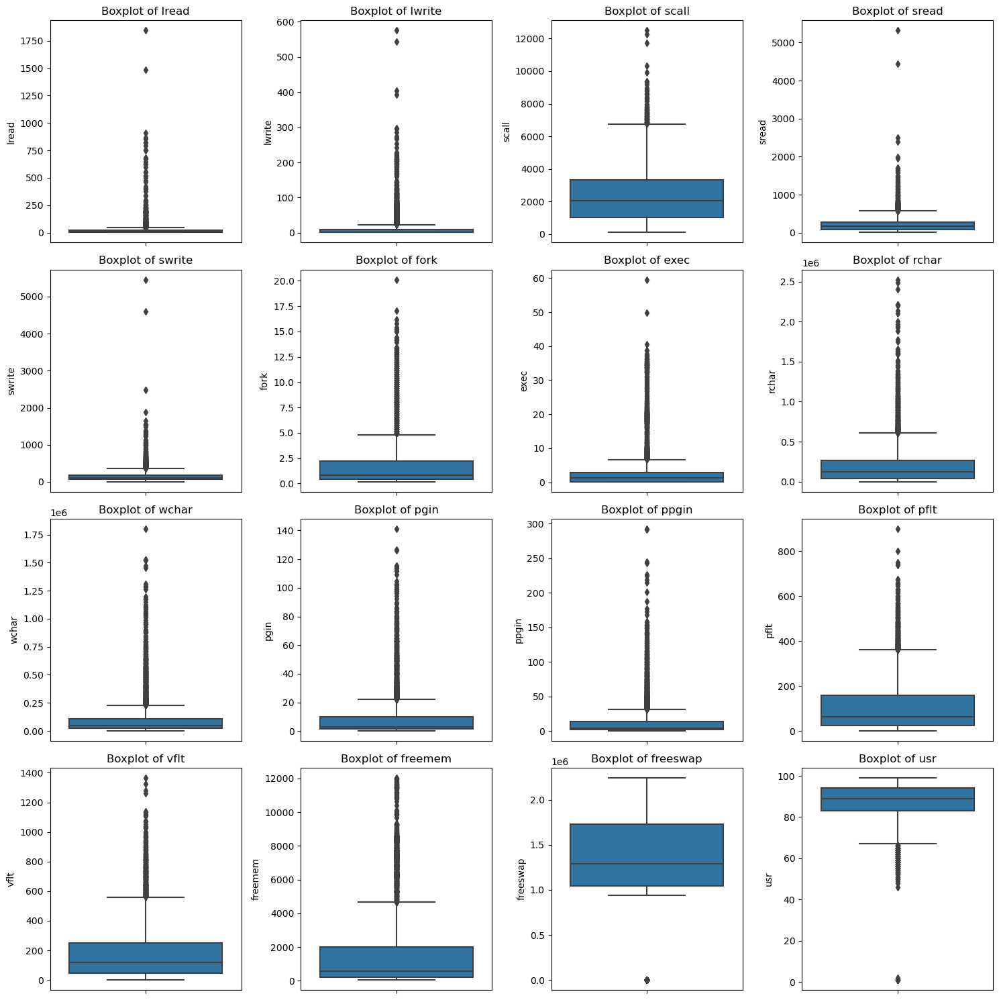

In [779]:
plt.figure(figsize=(15,15))
feature_list= ca_num.columns
for i in range(len(feature_list)):
    plt.subplot(4, 4, i+1) 
    sns.boxplot(y=ca_num[feature_list[i]],data=ca_num) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()


In [780]:
def remove_outlier(col): 
    sorted(col) 
    Q1,Q3=np.percentile(col,[25,75]) 
    IQR=Q3-Q1 
    lower_range= Q1-(1.5 * IQR) 
    upper_range= Q3+(1.5 * IQR) 
    return lower_range, upper_range

In [781]:
for i in feature_list: 
    LL,UL= remove_outlier(ca_num[i]) 
    ca_num[i] = np.where(ca_num[i] > UL,UL, ca_num[i]) 
    ca_num[i] = np.where(ca_num[i] < LL,LL, ca_num[i])

C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3950197725.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3950197725.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3950197725.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3950197725.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3950197725.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3950197725.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3950197725.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Use

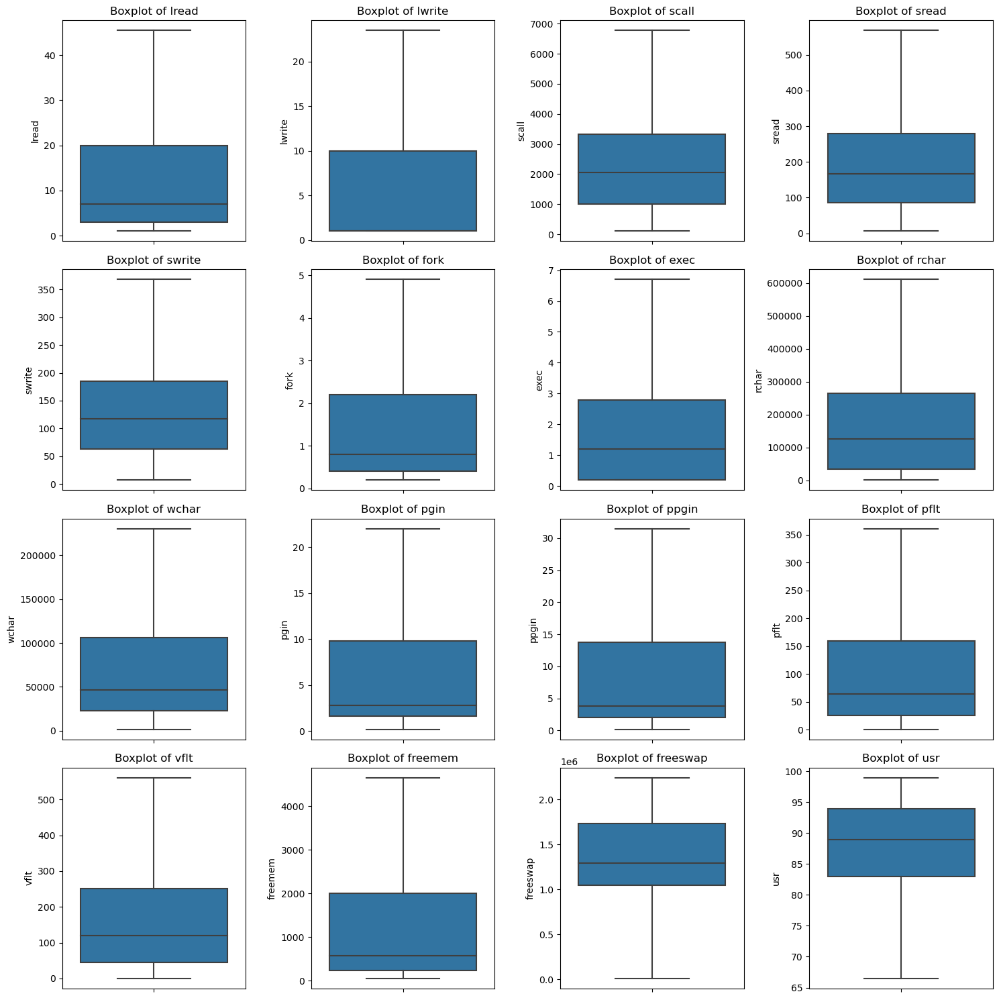

In [782]:
plt.figure(figsize=(15,15))
feature_list= ca_num.columns
for i in range(len(feature_list)): 
    plt.subplot(4, 4, i+1) 
    sns.boxplot(y=ca_num[feature_list[i]],data=ca_num) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()

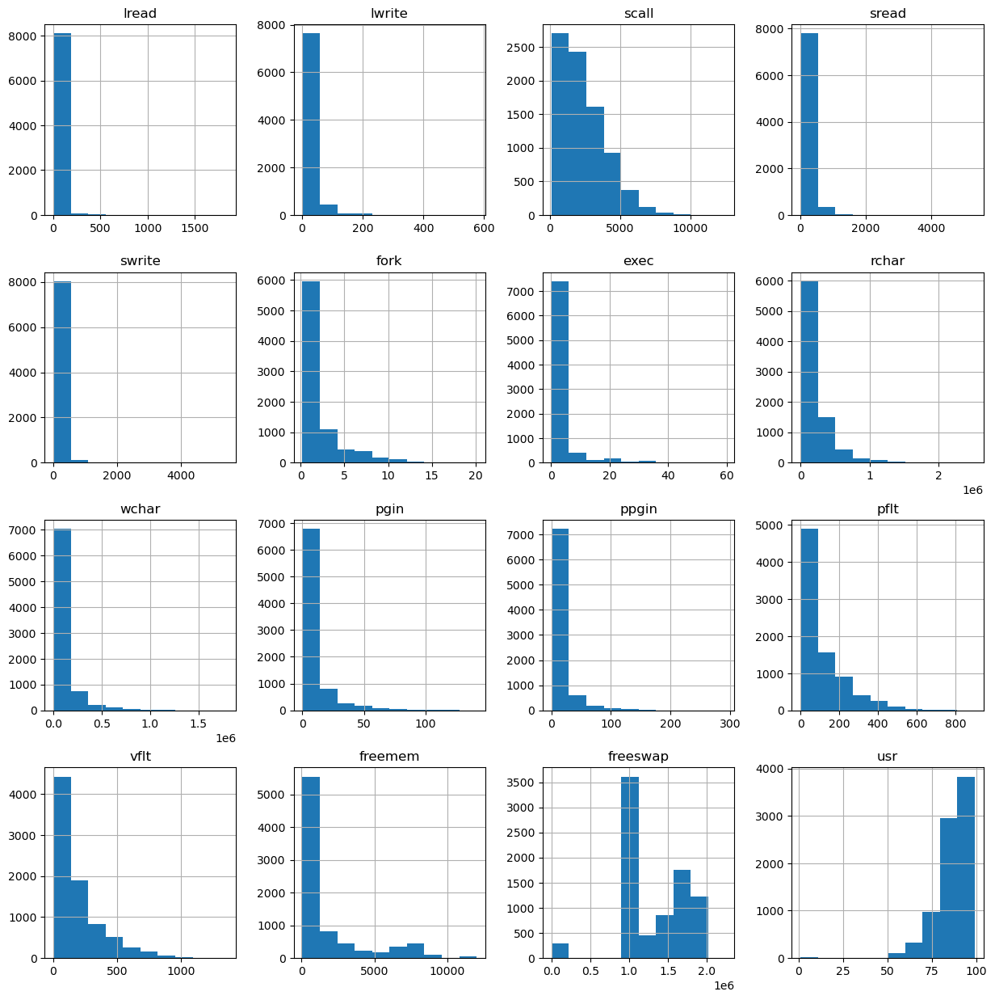

In [783]:
ca.hist(figsize=(15,15))
plt.show()

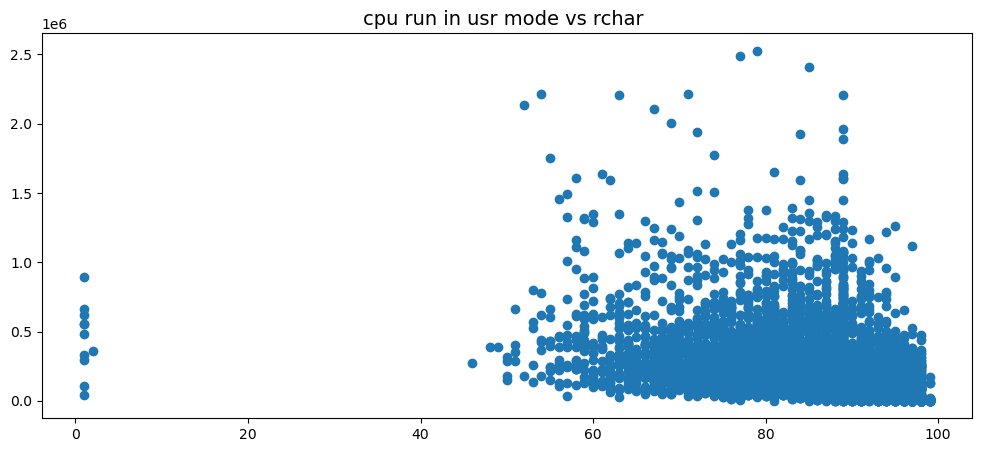

In [784]:
fig_dims=(12,5)
fig= plt.subplots(figsize=fig_dims)
plt.scatter(x='usr',y='rchar', data= ca)
plt.title('cpu run in usr mode vs rchar ',fontsize=14)
plt.show();

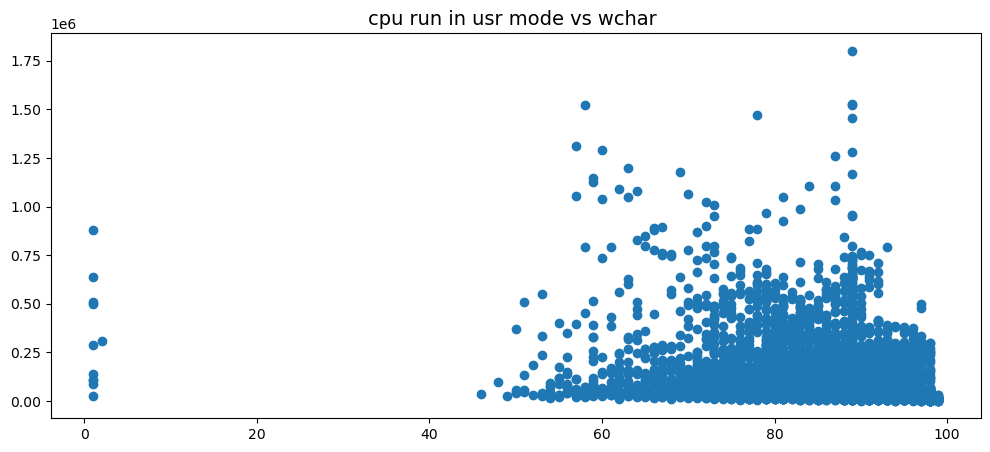

In [785]:
fig_dims=(12,5)
fig= plt.subplots(figsize=fig_dims)
plt.scatter(x='usr',y='wchar', data= ca)
plt.title('cpu run in usr mode vs wchar ',fontsize=14)
plt.show();

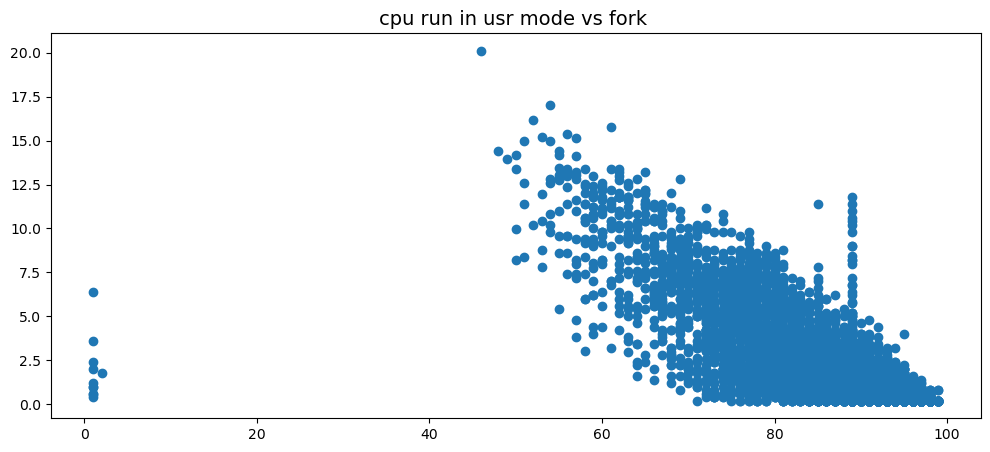

In [786]:
fig_dims=(12,5)
fig= plt.subplots(figsize=fig_dims)
plt.scatter(x='usr',y='fork', data= ca)
plt.title('cpu run in usr mode vs fork ',fontsize=14)
plt.show();


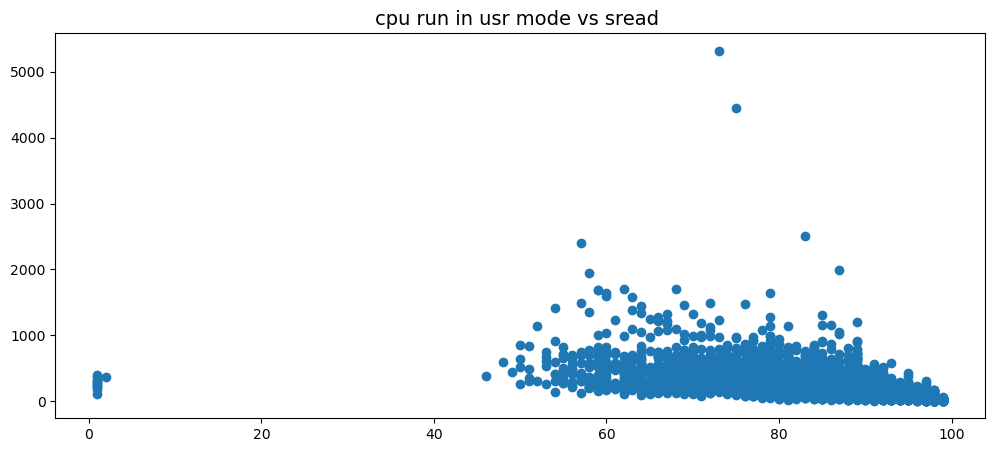

In [787]:
fig_dims=(12,5)
fig= plt.subplots(figsize=fig_dims)
plt.scatter(x='usr',y='sread', data= ca)
plt.title('cpu run in usr mode vs sread ',fontsize=14)
plt.show();

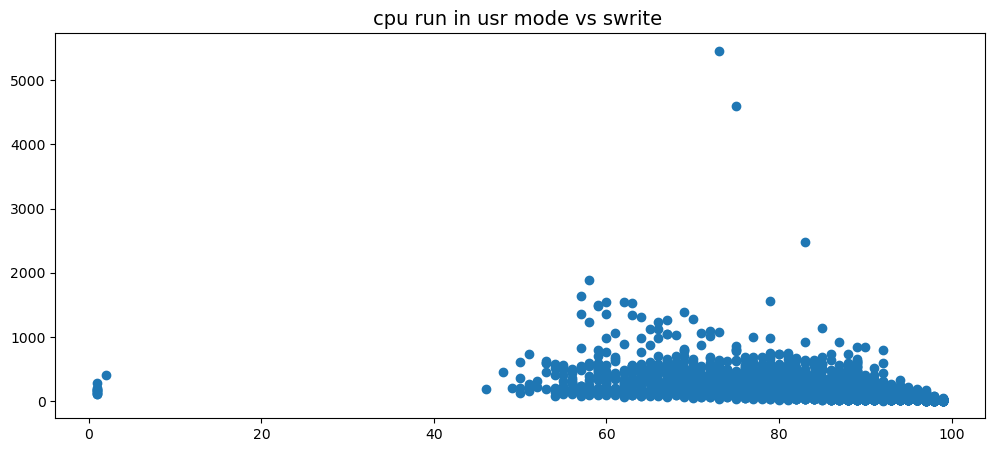

In [788]:
fig_dims=(12,5)
fig= plt.subplots(figsize=fig_dims)
plt.scatter(x='usr',y='swrite', data= ca)
plt.title('cpu run in usr mode vs swrite ',fontsize=14)
plt.show()

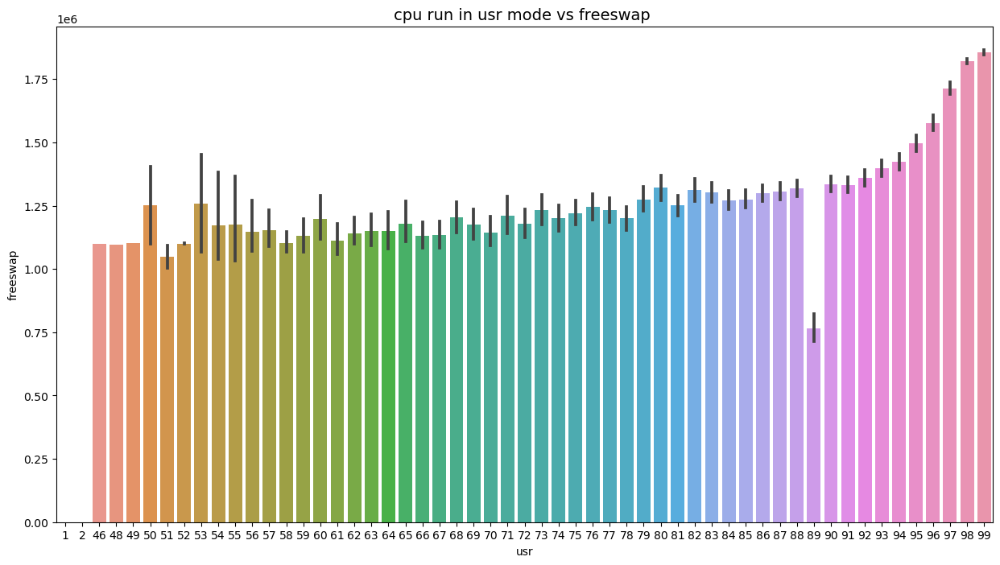

In [789]:
fig_dims=(15,8)
fig= plt.subplots(figsize=fig_dims)
sns.barplot(x='usr',y='freeswap', data= ca)
plt.title('cpu run in usr mode vs freeswap ',fontsize=14)
plt.show();

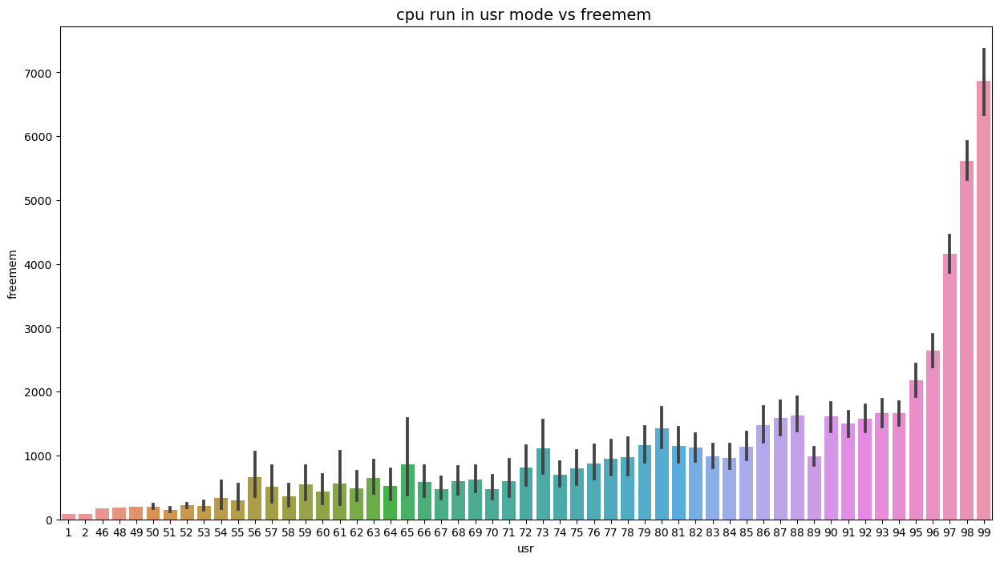

In [790]:
fig_dims=(15,8)
fig= plt.subplots(figsize=fig_dims)
sns.barplot(x='usr',y='freemem', data= ca)
plt.title('cpu run in usr mode vs freemem ',fontsize=14)
plt.show();

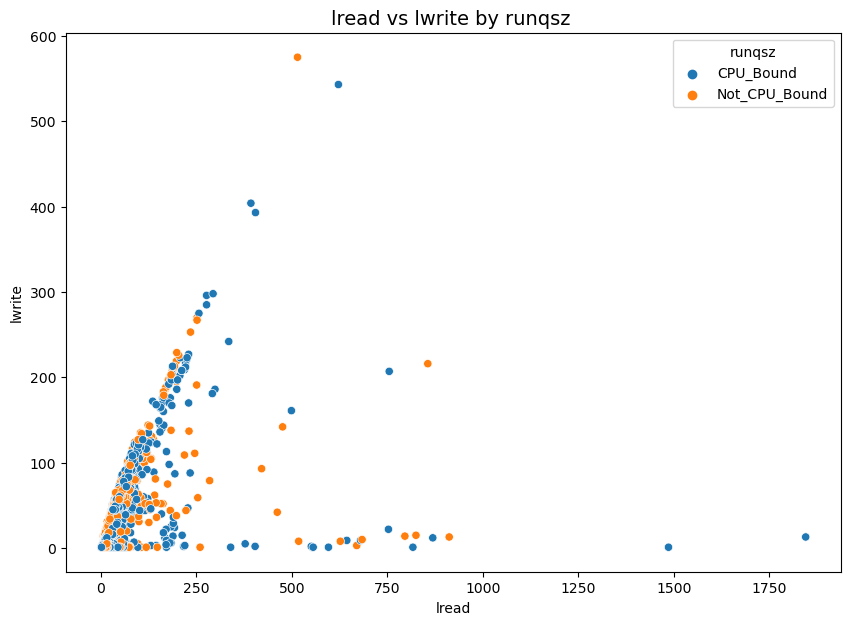

In [791]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='lread', y= 'lwrite',data=ca,hue='runqsz')
plt.title('lread vs lwrite by runqsz ',fontsize=14)
plt.show();

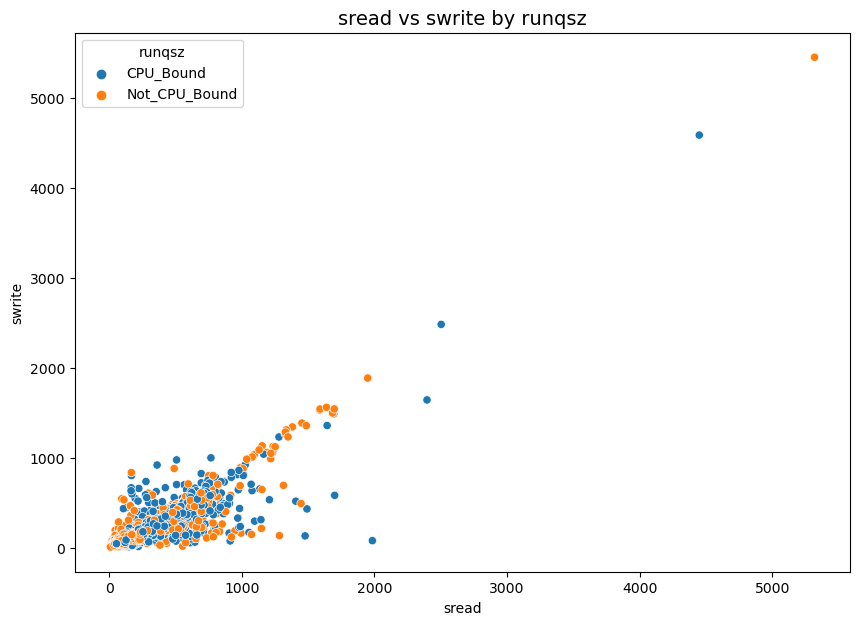

In [792]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='sread', y='swrite',data=ca,hue='runqsz')
plt.title('sread vs swrite by runqsz',fontsize=14)
plt.show();


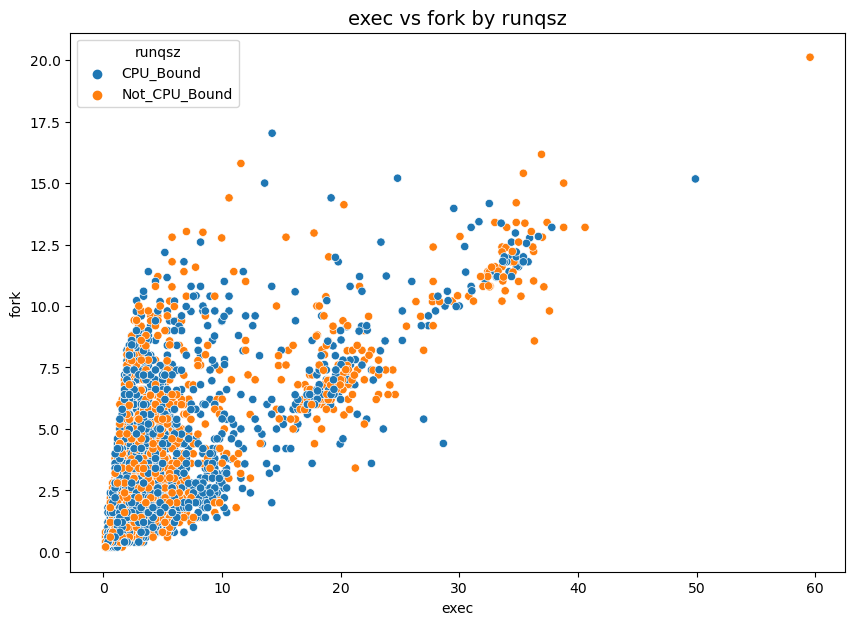

In [793]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='exec', y='fork',data=ca,hue='runqsz')
plt.title('exec vs fork by runqsz',fontsize=14)
plt.show();

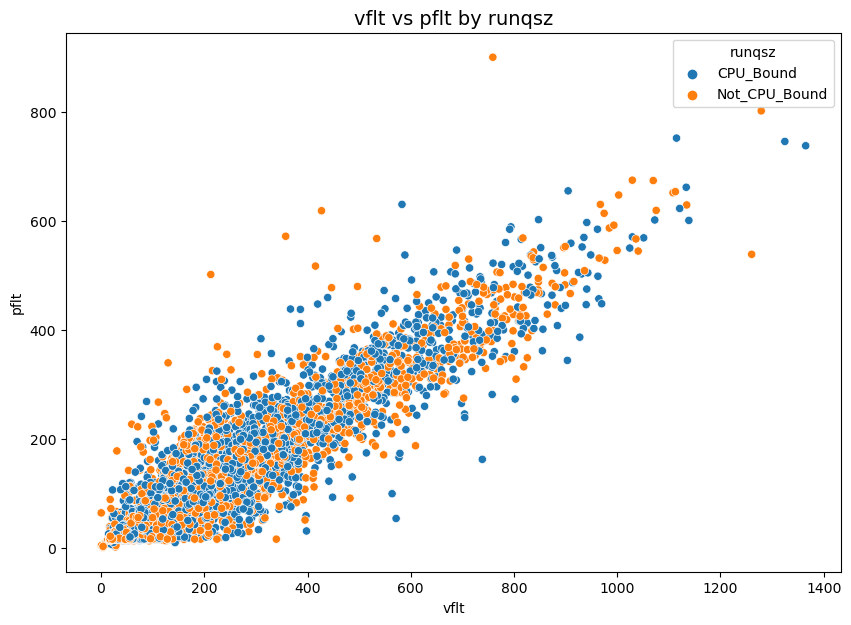

In [794]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='vflt', y='pflt',data=ca,hue='runqsz')
plt.title('vflt vs pflt by runqsz',fontsize=14)
plt.show();

In [795]:
ca_num.corr()


,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
lread,1.000000,0.827548,0.311692,0.303606,0.284089,0.344897,0.343601,0.238675,0.161430,0.255872,0.264319,0.354210,0.399510,-0.189052,-0.220320,-0.427215
lwrite,0.827548,1.000000,0.137430,0.145805,0.129290,0.089957,0.118182,0.115714,0.129947,0.103827,0.109948,0.099747,0.132512,-0.101668,-0.147760,-0.169155
scall,0.311692,0.137430,1.000000,0.763001,0.742206,0.473931,0.439110,0.386875,0.331933,0.306777,0.298207,0.485143,0.548081,-0.388969,-0.357864,-0.719677
sread,0.303606,0.145805,0.763001,1.000000,0.876652,0.527536,0.368862,0.576127,0.415059,0.323644,0.322648,0.529167,0.597892,-0.349887,-0.369897,-0.694638
swrite,0.284089,0.129290,0.742206,0.876652,1.000000,0.518853,0.312562,0.419759,0.430126,0.285817,0.281703,0.505362,0.563163,-0.350318,-0.336869,-0.666116
fork,0.344897,0.089957,0.473931,0.527536,0.518853,1.000000,0.773772,0.370491,0.122580,0.234980,0.223515,0.938801,0.932208,-0.135541,-0.132593,-0.783740
exec,0.343601,0.118182,0.439110,0.368862,0.312562,0.773772,1.000000,0.324253,0.123445,0.280719,0.269849,0.757563,0.762709,-0.191383,-0.183675,-0.701395
rchar,0.238675,0.115714,0.386875,0.576127,0.419759,0.370491,0.324253,1.000000,0.486317,0.355068,0.377337,0.381335,0.438870,-0.165552,-0.230327,-0.510129
wchar,0.161430,0.129947,0.331933,0.415059,0.430126,0.122580,0.123445,0.486317,1.000000,0.233760,0.245300,0.125595,0.157922,-0.146838,-0.175309,-0.314052
pgin,0.255872,0.103827,0.306777,0.323644,0.285817,0.234980,0.280719,0.355068,0.233760,1.000000,0.958522,0.236922,0.380663,-0.263493,-0.326718,-0.465194


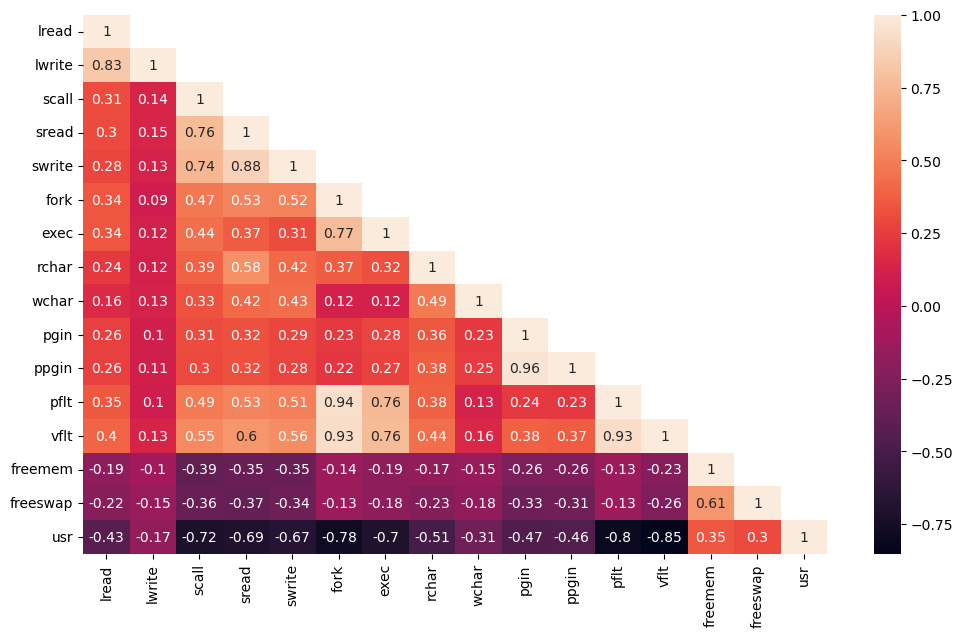

In [796]:
plt.figure(figsize=(12,7))
sns.heatmap(ca_num.corr(), annot=True,mask=np.triu(ca_num.corr(),+1));
plt.show()

C:\Users\THANUSRI\anaconda31\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


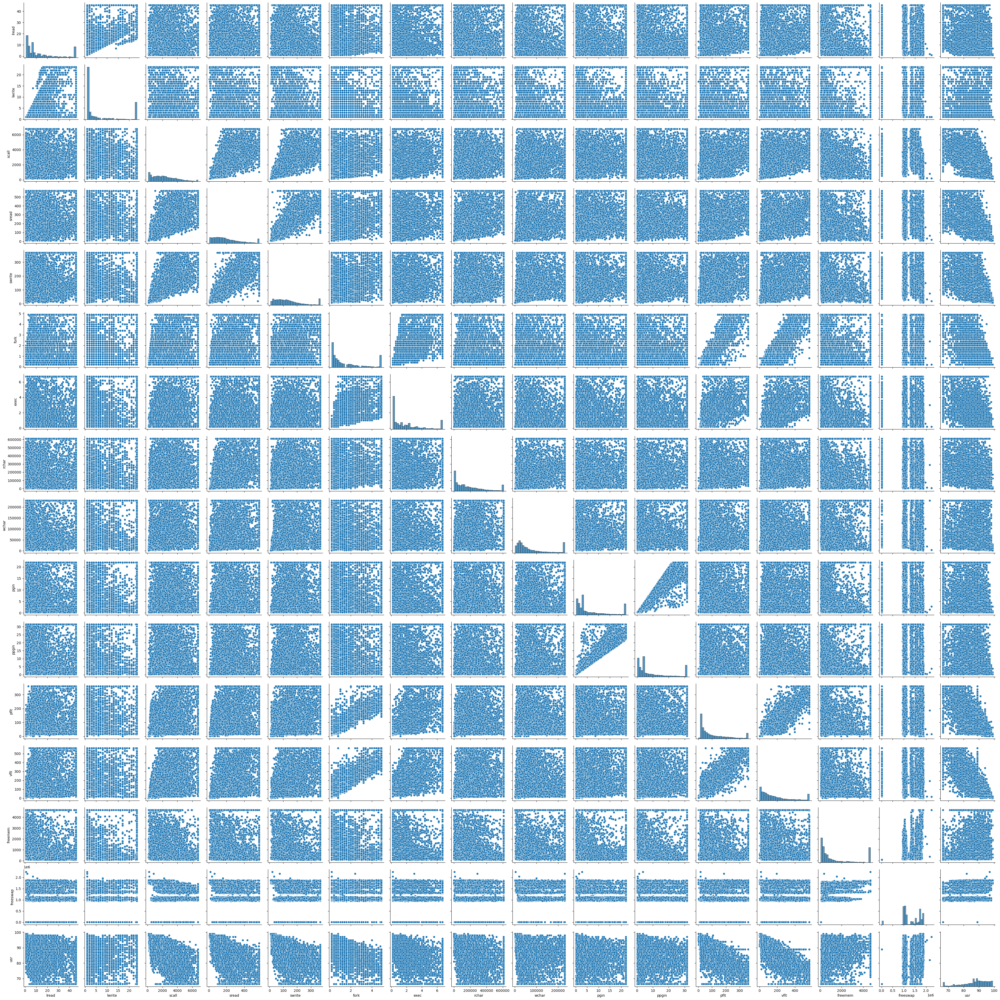

In [644]:
sns.pairplot(ca_num)

In [797]:
ca= pd.get_dummies(ca, columns=['runqsz'],drop_first=True)

In [798]:
ca.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,1,2147,79,68,0.2,0.2,40671.0,53995.0,1.6,2.6,16.00,26.40,4670,1730946,95,False
1,7,1,170,18,21,0.2,0.2,448.0,8385.0,2.8,3.8,15.63,16.83,7278,1869002,97,True
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,6.0,9.4,150.20,220.20,702,1021237,87,True
3,7,1,160,12,16,0.2,0.2,125473.5,8670.0,0.2,0.2,15.60,16.80,7248,1863704,98,True
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,1.0,1.2,37.80,47.60,633,1760253,90,True


In [799]:
ca.runqsz_Not_CPU_Bound = ca.runqsz_Not_CPU_Bound.replace({True: 1, False: 0})

In [800]:
ca.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,1,2147,79,68,0.2,0.2,40671.0,53995.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,7,1,170,18,21,0.2,0.2,448.0,8385.0,2.8,3.8,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,6.0,9.4,150.20,220.20,702,1021237,87,1
3,7,1,160,12,16,0.2,0.2,125473.5,8670.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,1.0,1.2,37.80,47.60,633,1760253,90,1


In [801]:
ca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   lread                 8192 non-null   int64  
 1   lwrite                8192 non-null   int64  
 2   scall                 8192 non-null   int64  
 3   sread                 8192 non-null   int64  
 4   swrite                8192 non-null   int64  
 5   fork                  8192 non-null   float64
 6   exec                  8192 non-null   float64
 7   rchar                 8192 non-null   float64
 8   wchar                 8192 non-null   float64
 9   pgin                  8192 non-null   float64
 10  ppgin                 8192 non-null   float64
 11  pflt                  8192 non-null   float64
 12  vflt                  8192 non-null   float64
 13  freemem               8192 non-null   int64  
 14  freeswap              8192 non-null   int64  
 15  usr                  

In [802]:
data_ds=ca.copy()

In [803]:
X= data_ds.drop('usr', axis=1)
y= data_ds[['usr']]

In [804]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
0,1,1,2147,79,68,0.2,0.2,40671.0,53995.0,1.6,2.6,16.00,26.40,4670,1730946,0
1,7,1,170,18,21,0.2,0.2,448.0,8385.0,2.8,3.8,15.63,16.83,7278,1869002,1
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,6.0,9.4,150.20,220.20,702,1021237,1
3,7,1,160,12,16,0.2,0.2,125473.5,8670.0,0.2,0.2,15.60,16.80,7248,1863704,1
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,1.0,1.2,37.80,47.60,633,1760253,1


In [805]:
y.head()

,usr
0,95
1,97
2,87
3,98
4,90


In [806]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.30 , random_state=123)

In [807]:
from sklearn.linear_model import LinearRegression

In [808]:
regression_model= LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [809]:
for idx, col_name in enumerate(X_train.columns): 
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lread is -0.012146380034548925
The coefficient for lwrite is -0.0016011667237528858
The coefficient for scall is -0.001240024487339167
The coefficient for sread is -0.00010576209172118666
The coefficient for swrite is -0.006442206641492385
The coefficient for fork is 0.3304251318479866
The coefficient for exec is -0.38950042722690004
The coefficient for rchar is -1.713818012907695e-06
The coefficient for wchar is -3.8637149520586104e-06
The coefficient for pgin is -0.04197267747231756
The coefficient for ppgin is -0.027936580799646765
The coefficient for pflt is -0.016836475444208562
The coefficient for vflt is -0.015064857428819092
The coefficient for freemem is 0.00017662414361003866
The coefficient for freeswap is -8.642658039727524e-08
The coefficient for runqsz_Not_CPU_Bound is -0.04136754471609674


In [810]:
intercept= regression_model.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is 97.50199997677092


In [811]:
regression_model.score(X_train, y_train)

0.7664568891348148

In [812]:
regression_model.score(X_test, y_test)

0.8616707861990465

In [813]:
from sklearn import metrics

In [814]:
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

4.57438741900247

In [815]:
predicted_test=regression_model.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

3.3068938651440583

In [673]:
import statsmodels.api as sm

In [674]:
X_train=sm.add_constant(X_train)
X_test=sm.add_constant(X_test)

In [675]:
model = sm.OLS(y_train,X_train).fit()


In [676]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.766
Model:                            OLS   Adj. R-squared:                  0.766
Method:                 Least Squares   F-statistic:                     1173.
Date:                Sat, 30 Dec 2023   Prob (F-statistic):               0.00
Time:                        08:04:25   Log-Likelihood:                -16855.
No. Observations:                5734   AIC:                         3.374e+04
Df Residuals:                    5717   BIC:                         3.386e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   97.5020 

In [677]:
predicted_train=model.predict(X_train)
mse=metrics.mean_squared_error(y_train,predicted_train)

In [678]:
np.sqrt(mse)

4.57438741900247

In [679]:
y_pred= model.predict(X_test)

In [680]:
mse=metrics.mean_squared_error(y_test,y_pred)

In [681]:
np.sqrt(mse)

3.3068938651439566

In [682]:
mse=metrics.mean_squared_error(y_test,y_pred)
np.sqrt(mse)

3.3068938651439566

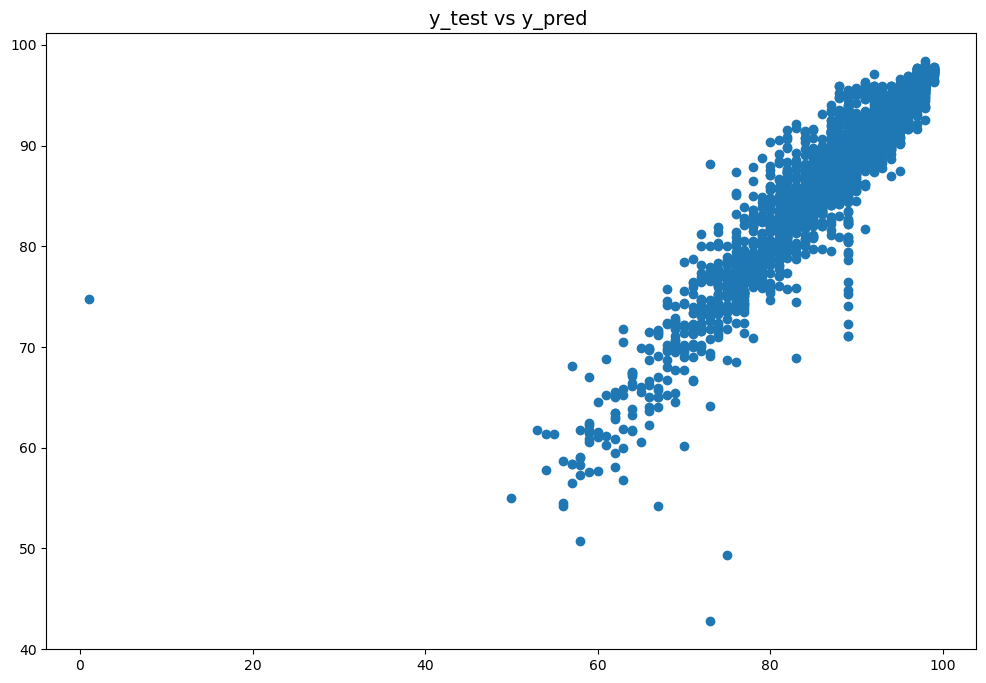

In [683]:
plt.figure(figsize=(12,8))
plt.scatter(y_test, y_pred)
plt.title('y_test vs y_pred ',fontsize=14)
plt.show()

In [684]:
data_ds=y_test.copy()
data_ds['predictive']=y_pred
data_ds['residual']=data_ds['usr']-data_ds['predictive']
data_ds.head()

,usr,predictive,residual
5455,96,94.048316,1.951684
152,76,76.457852,-0.457852
6394,95,93.606355,1.393645
7509,83,86.702820,-3.702820
6343,92,93.263191,-1.263191


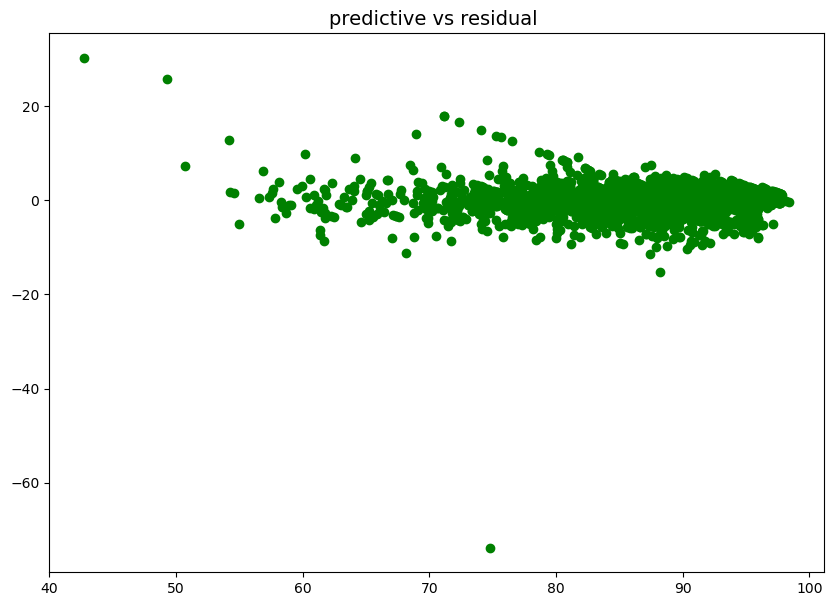

In [685]:
plt.figure(figsize=(10,7))
plt.scatter(data_ds['predictive'],data_ds['residual'],color='green')
plt.title('predictive vs residual ',fontsize=14)
plt.show()

C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1084189921.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_ds.residual);


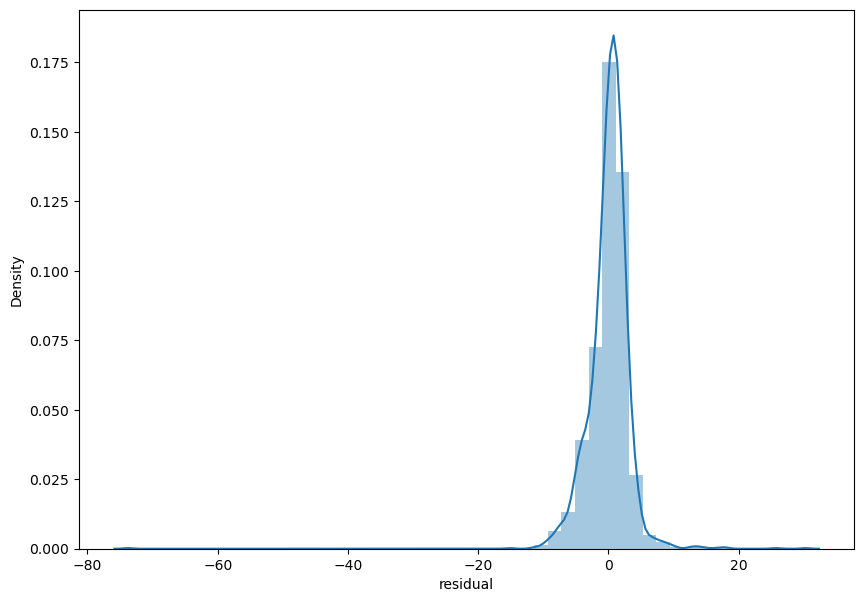

In [686]:
plt.figure(figsize=(10,7))
sns.distplot(data_ds.residual);
plt.show()

In [687]:
for i,j in np.array(model.params.reset_index()): 
    print('({}) * {} +'.format(round(j,4),i),end=' ')

(97.502) * const + (-0.0121) * lread + (-0.0016) * lwrite + (-0.0012) * scall + (-0.0001) * sread + (-0.0064) * swrite + (0.3304) * fork + (-0.3895) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.042) * pgin + (-0.0279) * ppgin + (-0.0168) * pflt + (-0.0151) * vflt + (0.0002) * freemem + (-0.0) * freeswap + (-0.0414) * runqsz_Not_CPU_Bound + 

# PROBLEM 2 

In [853]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay

In [854]:
cmd= pd.read_excel('Contraceptive_method_dataset.xlsx')

In [855]:
cmd.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [856]:
cmd.tail()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,Yes


In [857]:
print("no.of rows: ",cmd.shape[0], "no.of columns:",cmd.shape[1])

no.of rows:  1473 no.of columns: 10


In [858]:
cmd.shape

(1473, 10)

In [859]:
cmd.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
No_of_children_born,1452.0,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Husband_Occupation,1473.0,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0


In [860]:
cmd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [861]:
cmd.isnull().sum()


Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [862]:
cmd.duplicated().sum()

80

In [863]:
dups= cmd.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
cmd[dups]

Number of duplicate rows = 80


,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
79,38.0,Tertiary,Tertiary,1.0,Scientology,Yes,1,Very High,Exposed,No
167,26.0,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
224,47.0,Tertiary,Tertiary,4.0,Scientology,No,1,Very High,Exposed,No
270,30.0,Tertiary,Tertiary,2.0,Scientology,No,1,Very High,Exposed,No
299,26.0,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1367,44.0,Tertiary,Tertiary,5.0,Scientology,Yes,1,Very High,Exposed,Yes
1387,NaN,Secondary,Tertiary,2.0,Scientology,Yes,2,Very High,Exposed,Yes
1423,NaN,Tertiary,Tertiary,2.0,Non-Scientology,No,1,Very High,Exposed,Yes
1440,NaN,Tertiary,Tertiary,1.0,Non-Scientology,Yes,2,Very High,Exposed,Yes


In [864]:
cmd.drop_duplicates(inplace=True)

In [865]:
dups= cmd.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
cmd[dups]

Number of duplicate rows = 0


,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used


In [866]:
print("no.of rows: ",cmd.shape[0], "no.of columns:",cmd.shape[1])

no.of rows:  1393 no.of columns: 10


In [867]:
cmd.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1326.0,32.557315,8.289259,16.0,26.0,32.0,39.0,49.0
No_of_children_born,1372.0,3.290816,2.399697,0.0,1.0,3.0,5.0,16.0
Husband_Occupation,1393.0,2.174444,0.854590,1.0,1.0,2.0,3.0,4.0


In [868]:
cmd.isnull().sum()

Wife_age                     67
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [869]:
median_1= cmd['Wife_age'].median()
cmd['Wife_age'] = cmd['Wife_age'].replace(np.nan,median_1)

In [870]:
median_2= cmd['No_of_children_born'].median()
cmd['No_of_children_born'] = cmd['No_of_children_born'].replace(np.nan,median_2)

In [871]:
cmd.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [872]:
cmd.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1393.0,32.530510,8.088188,16.0,26.0,32.0,38.0,49.0
No_of_children_born,1393.0,3.286432,2.381791,0.0,1.0,3.0,5.0,16.0
Husband_Occupation,1393.0,2.174444,0.854590,1.0,1.0,2.0,3.0,4.0


In [873]:
cmd_num= cmd.select_dtypes(include= ['float64', 'int64'])

In [874]:
cmd_num

,Wife_age,No_of_children_born,Husband_Occupation
0,24.0,3.0,2
1,45.0,10.0,3
2,43.0,7.0,3
3,42.0,9.0,3
4,36.0,8.0,3
...,...,...,...
1468,33.0,3.0,2
1469,33.0,3.0,1
1470,39.0,3.0,1
1471,33.0,3.0,2


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\792512229.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\792512229.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


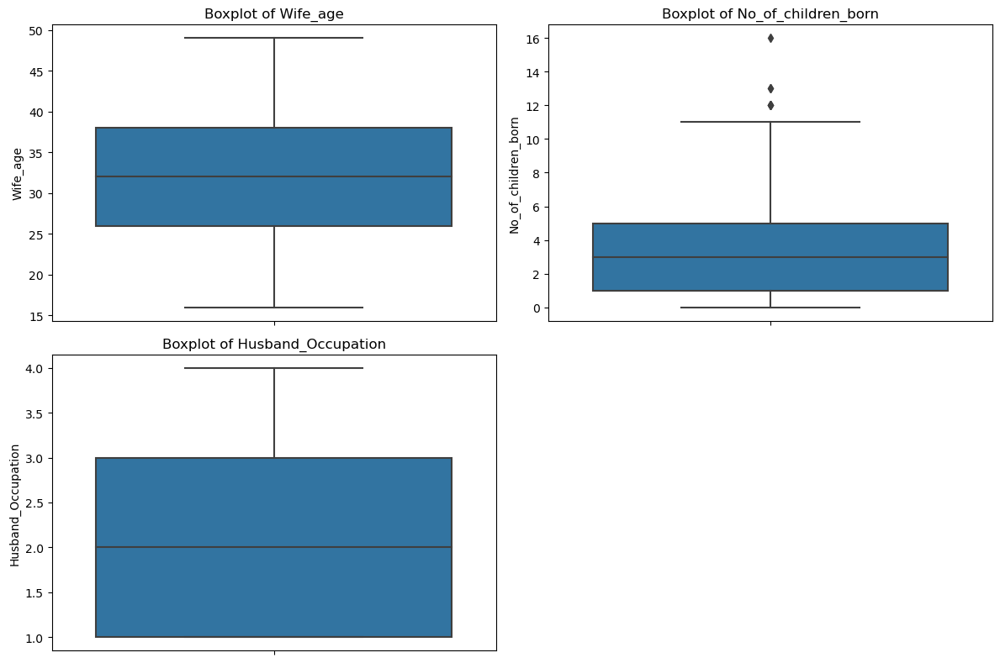

In [875]:
plt.figure(figsize=(12,8))
feature_list= cmd_num.columns
for i in range(len(feature_list)): 
    plt.subplot(2, 2, i+1)
    sns.boxplot(y=cmd_num[feature_list[i]],data=cmd_num)
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()


In [876]:
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1 
    lower_range= Q1-(1.5 * IQR) 
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range


In [877]:
for i in feature_list: 
    LL,UL= remove_outlier(cmd_num[i]) 
    cmd_num[i] = np.where(cmd_num[i] > UL,UL, cmd_num[i]) 
    cmd_num[i] = np.where(cmd_num[i] < LL,LL, cmd_num[i])

C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\2798478144.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\2798478144.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


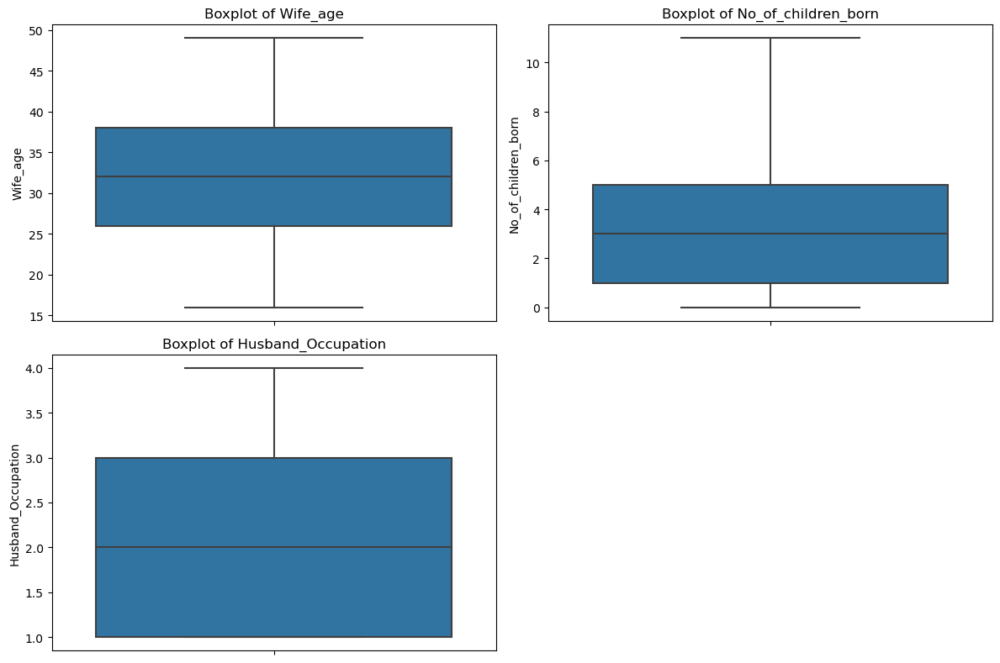

In [878]:
plt.figure(figsize=(12,8))
feature_list= cmd_num.columns
for i in range (len(feature_list)):
    plt.subplot(2, 2, i+1) 
    sns.boxplot(y=cmd_num[feature_list[i]],data=cmd_num)
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()
    


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1820995128.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1820995128.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1820995128.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1820995128.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1820995128.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1820995128.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\1820995128.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Use

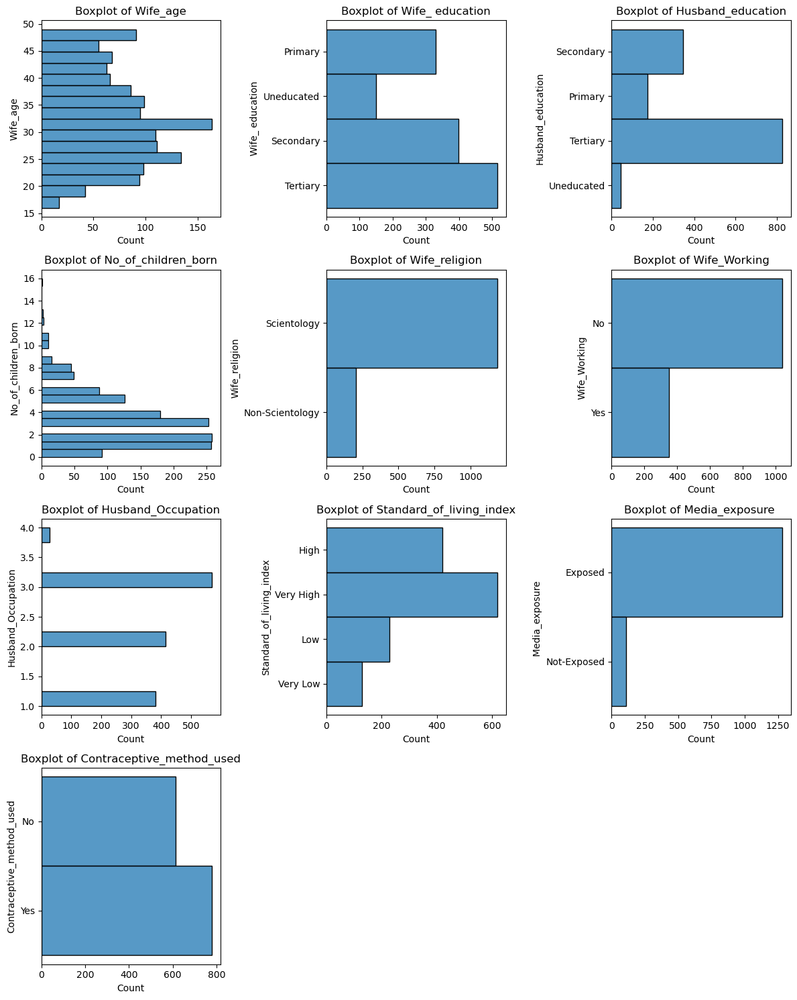

In [879]:
plt.figure(figsize=(12,15))
feature_list= cmd.columns
for i in range(len(feature_list)): 
    plt.subplot(4, 3, i+1) 
    sns.histplot(y=cmd[feature_list[i]],data=cmd) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()

C:\Users\THANUSRI\anaconda31\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x800 with 0 Axes>

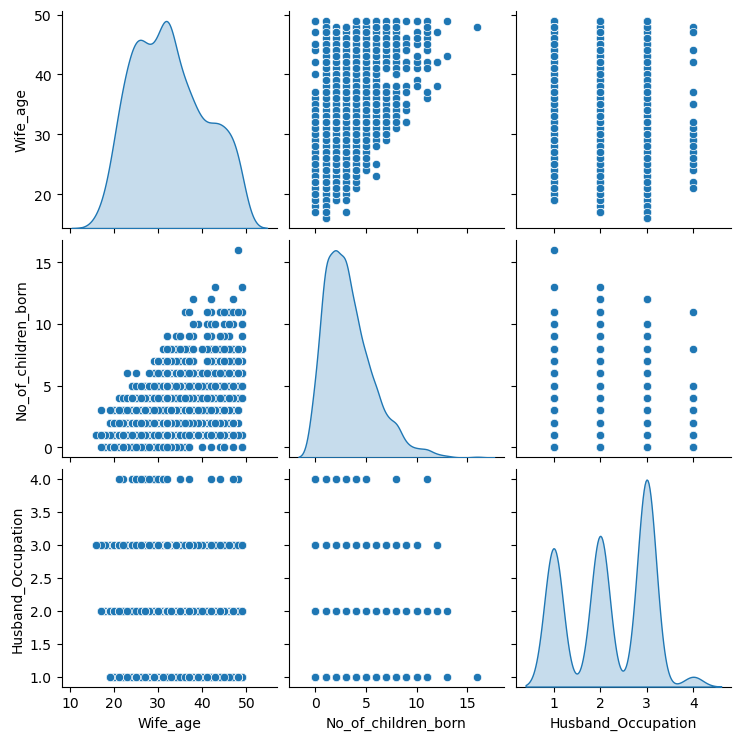

In [880]:
plt.figure(figsize=(12,8))
sns.pairplot(cmd, diag_kind="kde")
plt.show()

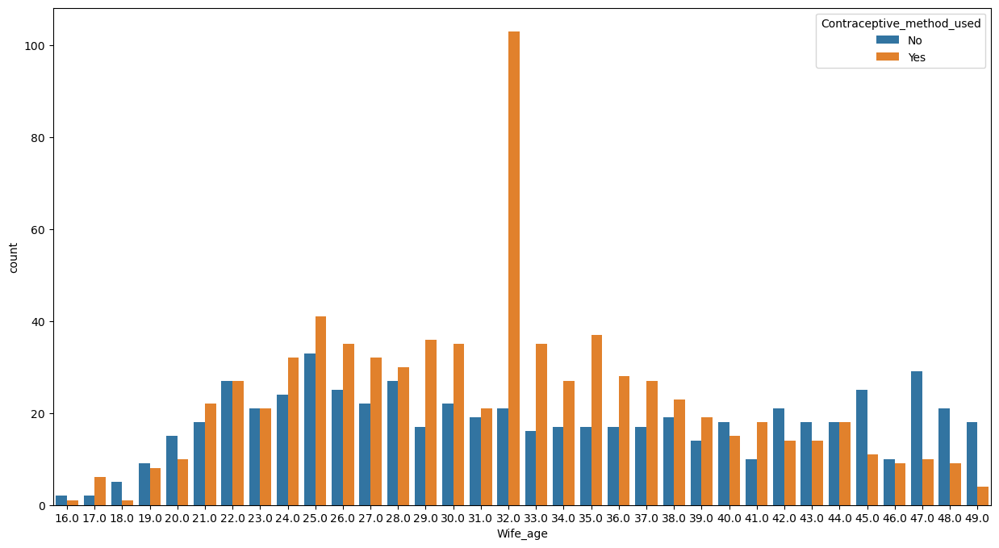

In [881]:
fig_dims=(15,8)
fig= plt.subplots(figsize=fig_dims)
sns.countplot(x='Wife_age',data=cmd,hue='Contraceptive_method_used')
plt.show();

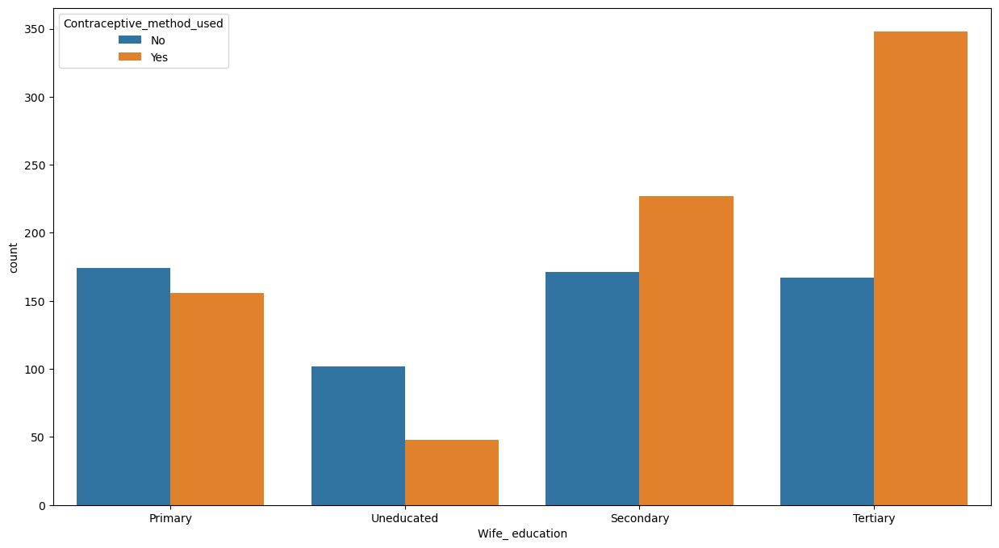

In [882]:
fig_dims=(15,8)
fig= plt.subplots(figsize=fig_dims)
sns.countplot(x='Wife_ education',data=cmd,hue='Contraceptive_method_used')
plt.show();

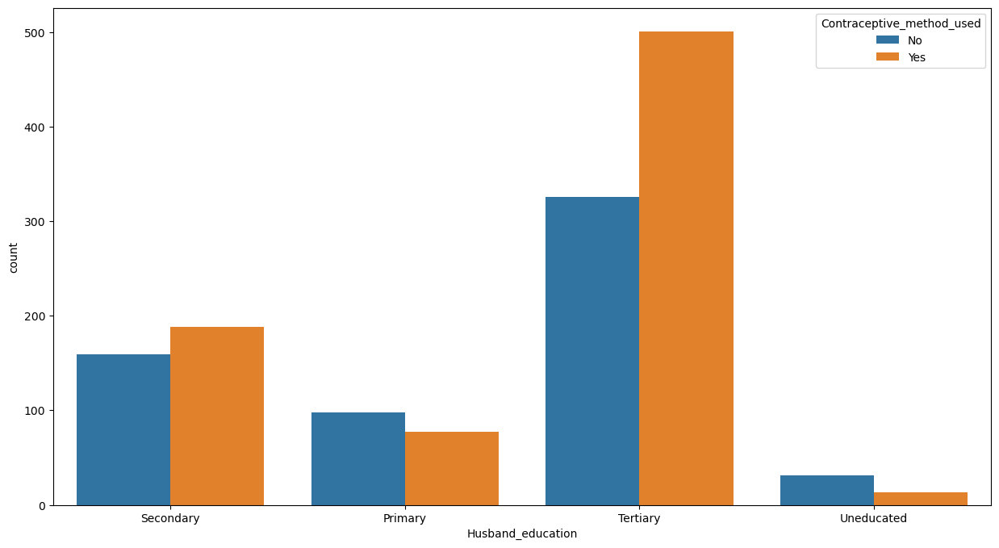

In [883]:
fig_dims=(15,8)
fig= plt.subplots(figsize=fig_dims)
sns.countplot(x='Husband_education',data=cmd,hue='Contraceptive_method_used')
plt.show();

C:\Users\THANUSRI\anaconda31\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


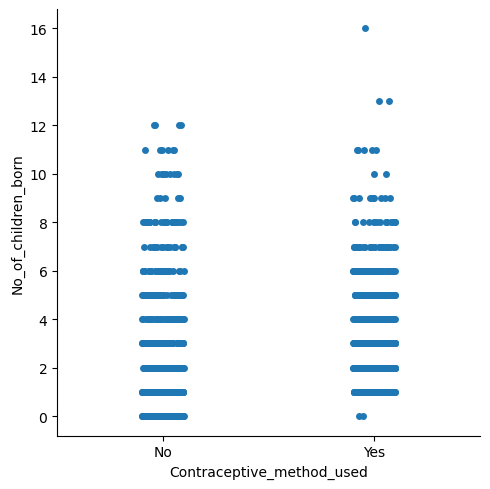

In [884]:
sns.catplot(data=cmd, x="Contraceptive_method_used", y="No_of_children_born")

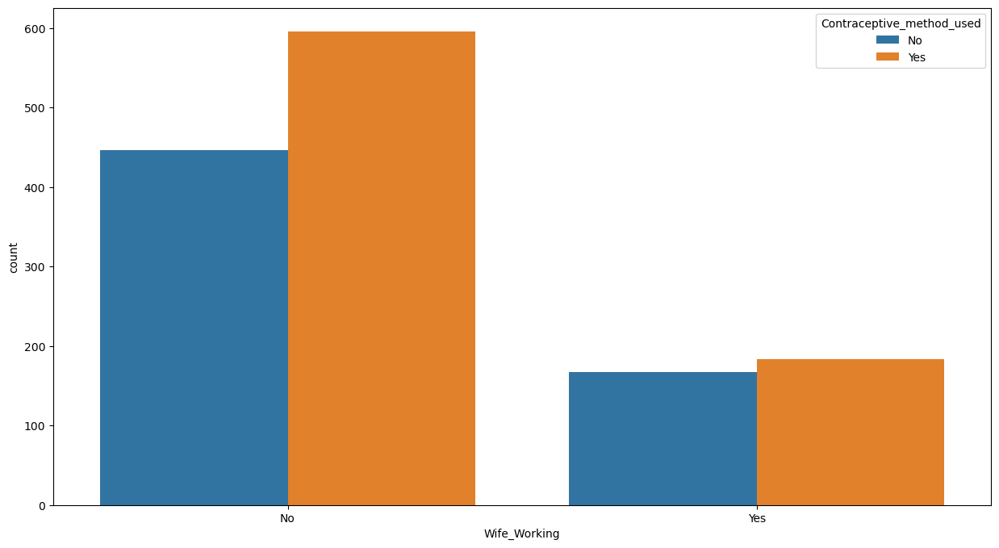

In [885]:
fig_dims=(15,8)
fig= plt.subplots(figsize=fig_dims)
sns.countplot(x='Wife_Working',data=cmd,hue='Contraceptive_method_used')
plt.show();

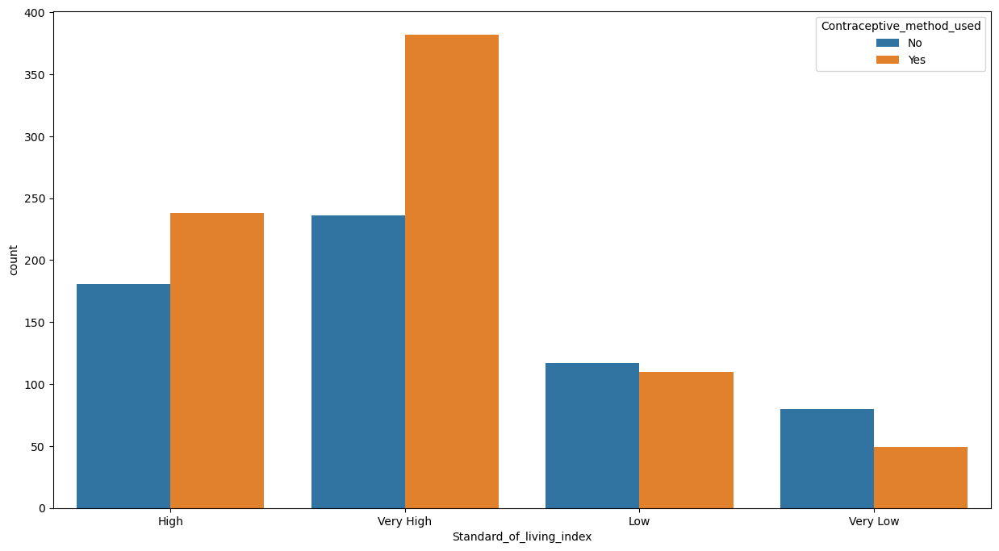

In [886]:
fig_dims=(15,8)
fig= plt.subplots(figsize=fig_dims)
sns.countplot(x='Standard_of_living_index',data=cmd,hue='Contraceptive_method_used')
plt.show();

In [887]:
cmd_num.corr()

,Wife_age,No_of_children_born,Husband_Occupation
Wife_age,1.000000,0.530123,-0.187070
No_of_children_born,0.530123,1.000000,-0.021981
Husband_Occupation,-0.187070,-0.021981,1.000000


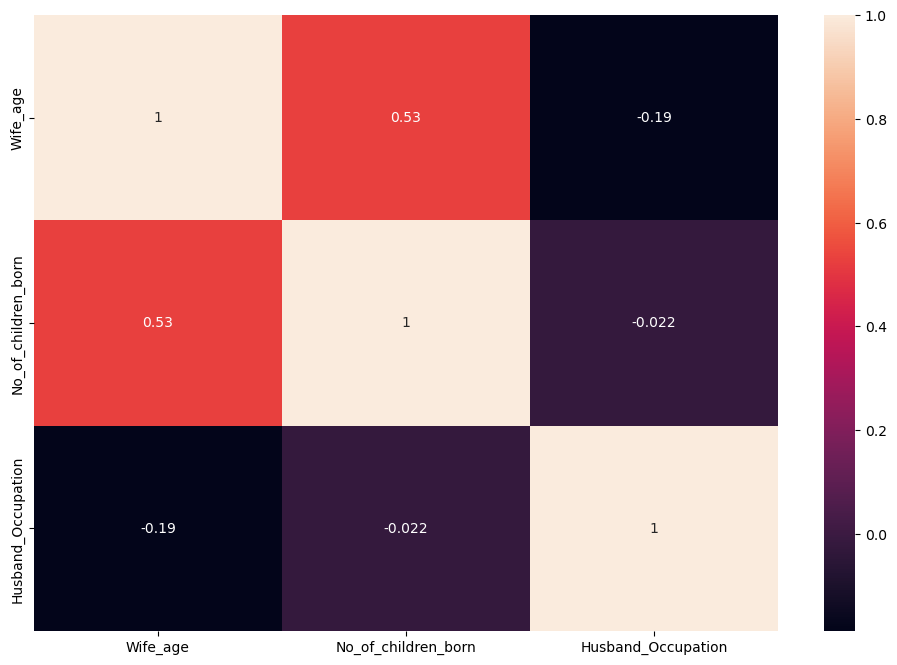

In [888]:
plt.figure(figsize=(12,8))
sns.heatmap(cmd_num.iloc[:, 0:10].corr(),annot=True)
plt.show()

In [889]:
cmd['Wife_ education'].value_counts()

Wife_ education
Tertiary      515
Secondary     398
Primary       330
Uneducated    150
Name: count, dtype: int64

In [890]:
cmd['Wife_ education']=np.where(cmd['Wife_ education'] =='Uneducated', 1, cmd['Wife_ education'])
cmd['Wife_ education']=np.where(cmd['Wife_ education'] =='Primary', 2, cmd['Wife_ education'])
cmd['Wife_ education']=np.where(cmd['Wife_ education'] =='Secondary', 3, cmd['Wife_ education'])
cmd['Wife_ education']=np.where(cmd['Wife_ education'] =='Tertiary', 4, cmd['Wife_ education'])

In [891]:
cmd['Husband_education'].value_counts()

Husband_education
Tertiary      827
Secondary     347
Primary       175
Uneducated     44
Name: count, dtype: int64

In [892]:
cmd['Husband_education']=np.where(cmd['Husband_education'] =='Uneducated', 1,cmd['Husband_education'])
cmd['Husband_education']=np.where(cmd['Husband_education'] =='Primary', 2,cmd['Husband_education'])
cmd['Husband_education']=np.where(cmd['Husband_education'] =='Secondary', 3,cmd['Husband_education'])
cmd['Husband_education']=np.where(cmd['Husband_education'] =='Tertiary', 4,cmd['Husband_education'])

In [893]:
cmd['Standard_of_living_index'].value_counts()

Standard_of_living_index
Very High    618
High         419
Low          227
Very Low     129
Name: count, dtype: int64

In [894]:
cmd['Standard_of_living_index']=np.where(cmd['Standard_of_living_index'] =='Very Low',1,cmd['Standard_of_living_index'])
cmd['Standard_of_living_index']=np.where(cmd['Standard_of_living_index'] =='Low',2,cmd['Standard_of_living_index'])
cmd['Standard_of_living_index']=np.where(cmd['Standard_of_living_index'] =='High',3,cmd['Standard_of_living_index'])
cmd['Standard_of_living_index']=np.where(cmd['Standard_of_living_index'] =='Very High',4,cmd['Standard_of_living_index'])

In [895]:
cmd['Wife_Working'].value_counts()

Wife_Working
No     1043
Yes     350
Name: count, dtype: int64

In [896]:
cmd['Wife_Working']=np.where(cmd['Wife_Working'] =='No', 0, cmd['Wife_Working'])
cmd['Wife_Working']=np.where(cmd['Wife_Working'] =='Yes', 1, cmd['Wife_Working'])

In [897]:
cmd['Contraceptive_method_used'].value_counts()

Contraceptive_method_used
Yes    779
No     614
Name: count, dtype: int64

In [898]:
cmd['Contraceptive_method_used']=np.where(cmd['Contraceptive_method_used'] =='No',0,cmd['Contraceptive_method_used'])
cmd['Contraceptive_method_used']=np.where(cmd['Contraceptive_method_used'] =='Yes',1,cmd['Contraceptive_method_used'])

In [899]:
cmd['Media_exposure '].value_counts()

Media_exposure 
Exposed        1284
Not-Exposed     109
Name: count, dtype: int64

In [900]:
cmd['Media_exposure ']=np.where(cmd['Media_exposure '] =='Not-Exposed', 0, cmd['Media_exposure '])
cmd['Media_exposure ']=np.where(cmd['Media_exposure '] =='Exposed', 1, cmd['Media_exposure '])

In [901]:
cmd['Wife_religion'].value_counts()

Wife_religion
Scientology        1186
Non-Scientology     207
Name: count, dtype: int64

In [902]:
cmd['Wife_religion']=np.where(cmd['Wife_religion'] =='Non-Scientology', 0, cmd['Wife_religion'])
cmd['Wife_religion']=np.where(cmd['Wife_religion'] =='Scientology',1,cmd['Wife_religion'])

In [903]:
cmd.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,2,3,3.0,1,0,2,3,1,0
1,45.0,1,3,10.0,1,0,3,4,1,0
2,43.0,2,3,7.0,1,0,3,4,1,0
3,42.0,3,2,9.0,1,0,3,3,1,0
4,36.0,3,3,8.0,1,0,3,2,1,0


In [904]:
cmd.info()


<class 'pandas.core.frame.DataFrame'>
Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1393 non-null   float64
 1   Wife_ education            1393 non-null   object 
 2   Husband_education          1393 non-null   object 
 3   No_of_children_born        1393 non-null   float64
 4   Wife_religion              1393 non-null   object 
 5   Wife_Working               1393 non-null   object 
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   object 
 8   Media_exposure             1393 non-null   object 
 9   Contraceptive_method_used  1393 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 119.7+ KB


In [905]:
for feature in cmd.columns: 
    if cmd[feature].dtype== 'object': 
        cmd[feature] = pd.Categorical(cmd[feature]).codes

In [906]:
cmd.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1393 non-null   float64
 1   Wife_ education            1393 non-null   int8   
 2   Husband_education          1393 non-null   int8   
 3   No_of_children_born        1393 non-null   float64
 4   Wife_religion              1393 non-null   int8   
 5   Wife_Working               1393 non-null   int8   
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   int8   
 8   Media_exposure             1393 non-null   int8   
 9   Contraceptive_method_used  1393 non-null   int8   
dtypes: float64(2), int64(1), int8(7)
memory usage: 53.1 KB


C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3040378772.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3040378772.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3040378772.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3040378772.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3040378772.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3040378772.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\3040378772.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Use

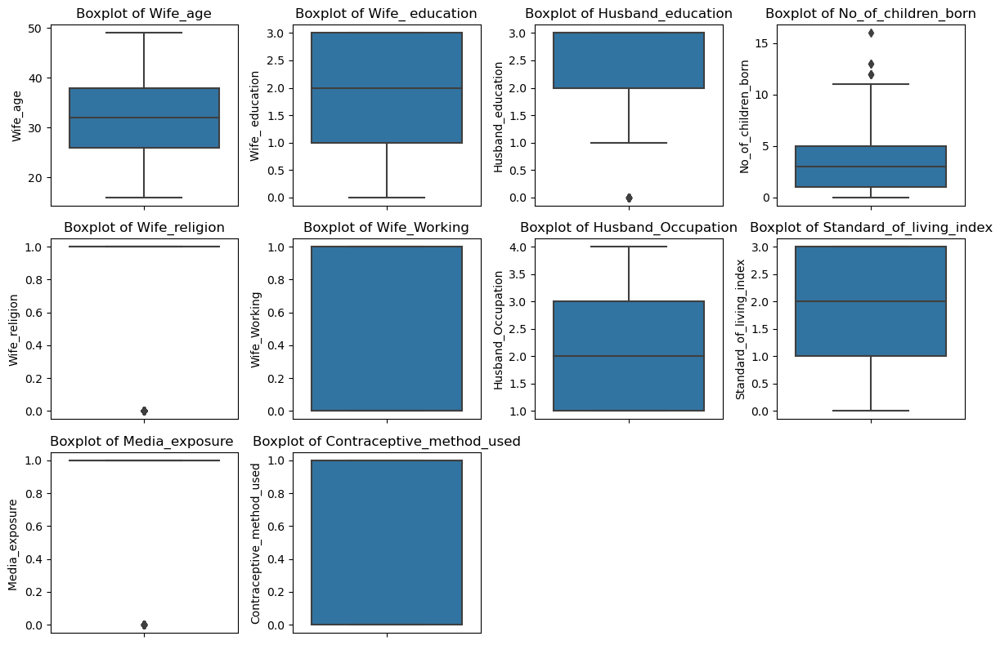

In [907]:
plt.figure(figsize=(12,8))
feature_list= cmd.columns
for i in range(len(feature_list)):
    plt.subplot(3, 4, i+1) 
    sns.boxplot(y=cmd[feature_list[i]],data=cmd) 
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [908]:
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1 
    lower_range= Q1-(1.5 * IQR) 
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range


In [909]:
for i in feature_list: 
    LL,UL= remove_outlier(cmd[i]) 
    cmd[i] = np.where(cmd[i] > UL,UL, cmd[i]) 
    cmd[i] = np.where(cmd[i] < LL,LL, cmd[i])

C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\31265314.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\31265314.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\31265314.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\31265314.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\31265314.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\31265314.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\AppData\Local\Temp\ipykernel_9592\31265314.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\THANUSRI\Ap

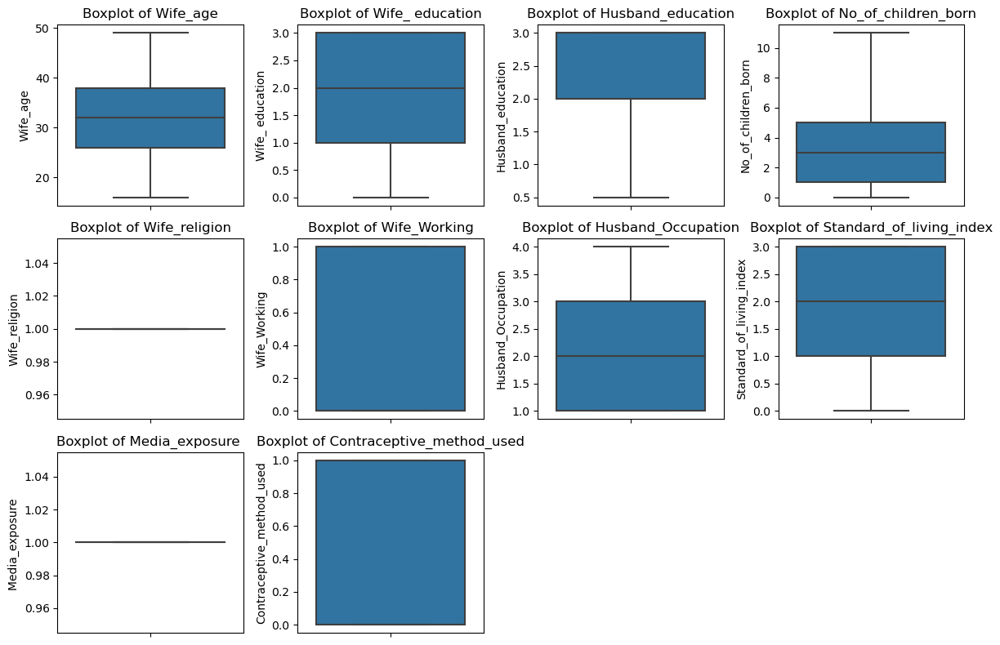

In [910]:
plt.figure(figsize=(12,8))
feature_list= cmd.columns
for i in range(len(feature_list)):
    plt.subplot(3, 4, i+1) 
    sns.boxplot(y=cmd[feature_list[i]],data=cmd) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()

C:\Users\THANUSRI\anaconda31\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


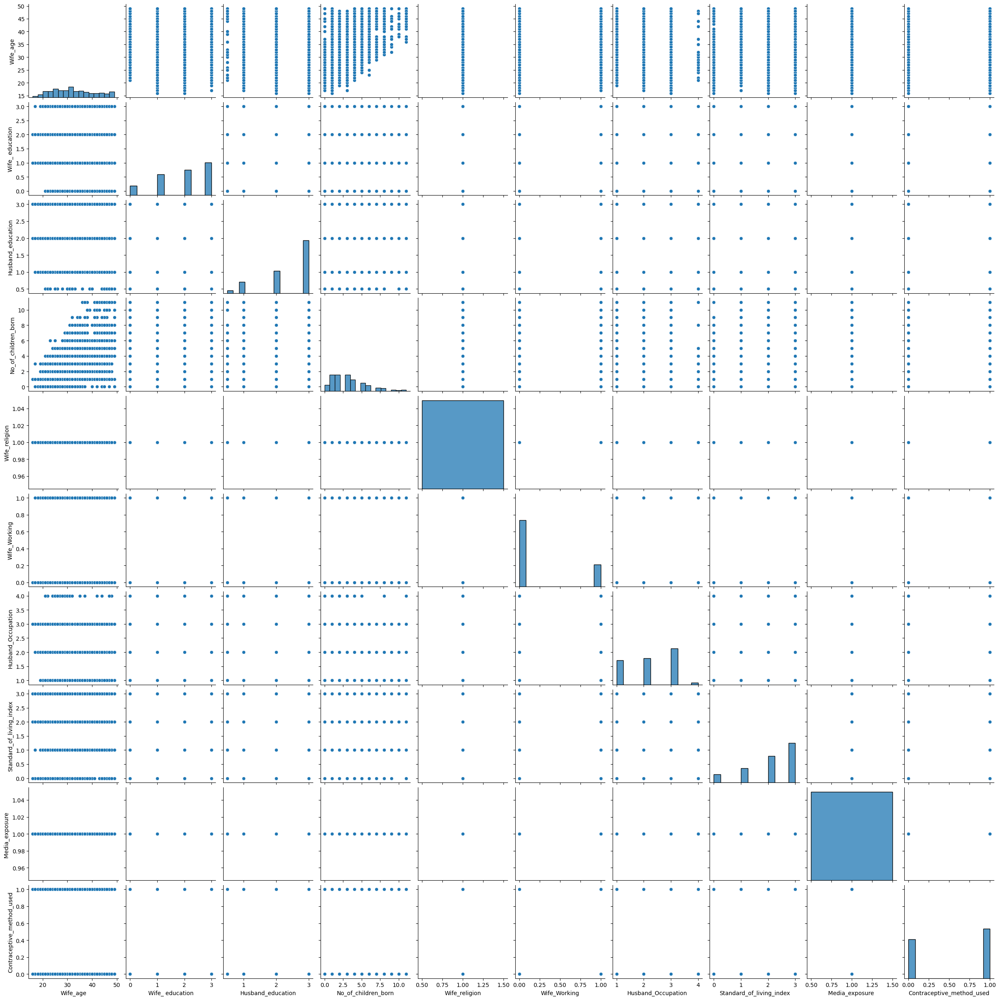

In [911]:
sns.pairplot(cmd)

In [912]:
cmd.corr()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
Wife_age,1.000000,-0.057025,-0.053098,0.530123,NaN,0.032000,-0.187070,0.171420,NaN,-0.098228
Wife_ education,-0.057025,1.000000,0.612967,-0.195769,NaN,0.058523,-0.370799,0.341412,NaN,0.228341
Husband_education,-0.053098,0.612967,1.000000,-0.189733,NaN,-0.002612,-0.324801,0.345690,NaN,0.141775
No_of_children_born,0.530123,-0.195769,-0.189733,1.000000,NaN,-0.103043,-0.021981,-0.004000,NaN,0.119098
Wife_religion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,0.032000,0.058523,-0.002612,-0.103043,NaN,1.000000,-0.013669,0.078367,NaN,-0.042433
Husband_Occupation,-0.187070,-0.370799,-0.324801,-0.021981,NaN,-0.013669,1.000000,-0.270934,NaN,-0.040438
Standard_of_living_index,0.171420,0.341412,0.345690,-0.004000,NaN,0.078367,-0.270934,1.000000,NaN,0.146416
Media_exposure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,-0.098228,0.228341,0.141775,0.119098,NaN,-0.042433,-0.040438,0.146416,NaN,1.000000


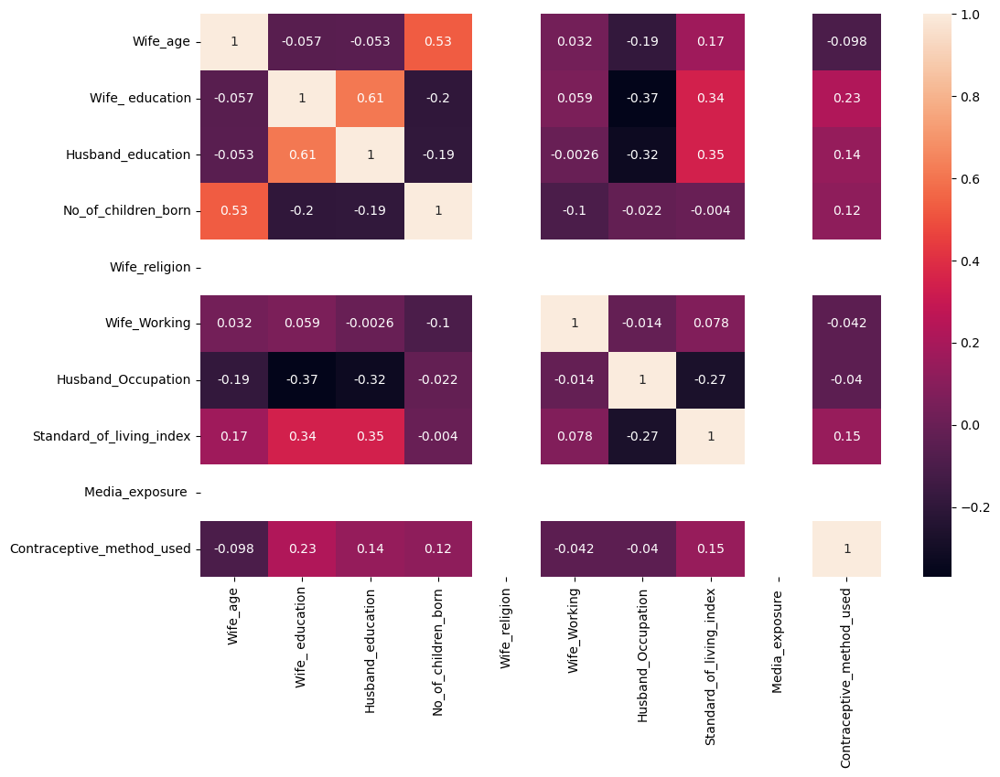

In [913]:
plt.figure(figsize=(12,8))
sns.heatmap(cmd.iloc[:, 0:10].corr(),annot=True)
plt.show()

# CART

In [914]:
cmd_1= cmd.copy()

In [915]:
X= cmd_1.drop("Contraceptive_method_used" , axis=1)
y= cmd_1.pop("Contraceptive_method_used")

In [916]:
X_train, X_test, train_labels, test_labels= train_test_split(X, y, test_size=0.30,random_state=1)

In [917]:
from sklearn.tree import DecisionTreeClassifier

In [918]:
dt_model= DecisionTreeClassifier(criterion= 'gini' )

In [919]:
dt_model.fit(X_train, train_labels)

DecisionTreeClassifier()

In [920]:
from sklearn import tree
train_char_label= ['0', '1']
Credit_Tree_File= open('d:\Contraceptive_method.dot','w')
dot_data= tree.export_graphviz(dt_model, out_file=Credit_Tree_File,feature_names = list(X_train), class_names = list(train_char_label))

Credit_Tree_File.close()

In [921]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                               Imp
Wife_age                  0.316134
Wife_ education           0.112728
Husband_education         0.055614
No_of_children_born       0.256892
Wife_religion             0.000000
Wife_Working              0.055761
Husband_Occupation        0.117332
Standard_of_living_index  0.085540
Media_exposure            0.000000


In [922]:
y_predict= dt_model.predict(X_test)

In [923]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 7,min_samples_leaf=10,min_samples_split=30)
reg_dt_model.fit(X_train, train_labels)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=10, min_samples_split=30)

In [924]:
credit_tree_regularized = open('d:\credit_tree_regularized.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= credit_tree_regularized , feature_names = list(X_train), class_names = list(train_char_label))

credit_tree_regularized.close()

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                               Imp
Wife_age                  0.316134
Wife_ education           0.112728
Husband_education         0.055614
No_of_children_born       0.256892
Wife_religion             0.000000
Wife_Working              0.055761
Husband_Occupation        0.117332
Standard_of_living_index  0.085540
Media_exposure            0.000000


In [925]:
ytrain_predict = reg_dt_model.predict(X_train)
ytest_predict = reg_dt_model.predict(X_test)

In [926]:
import matplotlib.pyplot as plt

AUC: 0.824


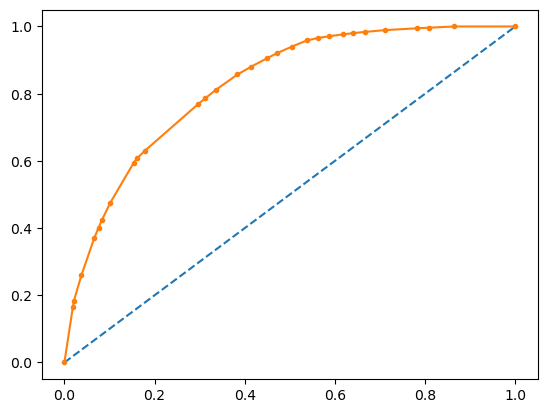

In [927]:
# AUC and ROC for the training data

# predict probabilities
probs = reg_dt_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(train_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(train_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

AUC: 0.700


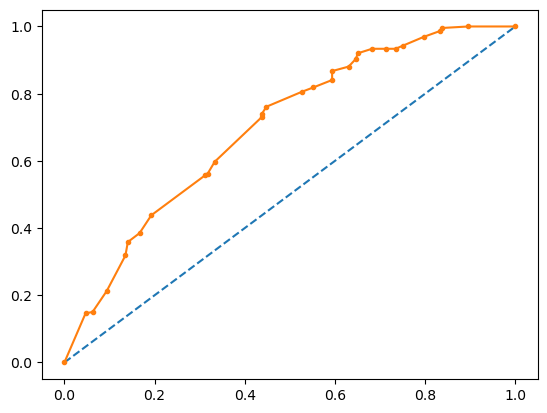

In [928]:
# AUC and ROC for the test data


# predict probabilities
probs = reg_dt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(test_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(test_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [929]:
from sklearn.metrics import classification_report,confusion_matrix

In [930]:

print(classification_report(train_labels, ytrain_predict))

              precision    recall  f1-score   support

         0.0       0.77      0.62      0.68       422
         1.0       0.75      0.86      0.80       553

    accuracy                           0.75       975
   macro avg       0.76      0.74      0.74       975
weighted avg       0.75      0.75      0.75       975



In [931]:
confusion_matrix(train_labels, ytrain_predict)

array([[260, 162],
       [ 79, 474]], dtype=int64)

In [932]:

print(classification_report(test_labels, ytest_predict))

              precision    recall  f1-score   support

         0.0       0.67      0.47      0.56       192
         1.0       0.64      0.81      0.72       226

    accuracy                           0.65       418
   macro avg       0.66      0.64      0.64       418
weighted avg       0.66      0.65      0.64       418



In [933]:
confusion_matrix(test_labels, ytest_predict)

array([[ 91, 101],
       [ 44, 182]], dtype=int64)

In [934]:
reg_dt_model.score(X_train,train_labels)

0.7528205128205128

In [935]:
reg_dt_model.score(X_test,test_labels)

0.65311004784689

# LOGISTIC_REGRESSION

In [936]:
cmd_2= cmd.copy()

In [937]:
from sklearn.preprocessing import LabelEncoder

In [938]:
LE= LabelEncoder()
LE

LabelEncoder()

In [939]:
cmd['Contraceptive_method_used'] = LE.fit_transform(cmd['Contraceptive_method_used'])
cmd.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,1.0,2.0,3.0,1.0,0.0,2.0,2.0,1.0,0
1,45.0,0.0,2.0,10.0,1.0,0.0,3.0,3.0,1.0,0
2,43.0,1.0,2.0,7.0,1.0,0.0,3.0,3.0,1.0,0
3,42.0,2.0,1.0,9.0,1.0,0.0,3.0,2.0,1.0,0
4,36.0,2.0,2.0,8.0,1.0,0.0,3.0,1.0,1.0,0


In [940]:
cmd_dummy= pd.get_dummies(cmd_2,drop_first=True)
cmd_dummy.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,1.0,2.0,3.0,1.0,0.0,2.0,2.0,1.0,0.0
1,45.0,0.0,2.0,10.0,1.0,0.0,3.0,3.0,1.0,0.0
2,43.0,1.0,2.0,7.0,1.0,0.0,3.0,3.0,1.0,0.0
3,42.0,2.0,1.0,9.0,1.0,0.0,3.0,2.0,1.0,0.0
4,36.0,2.0,2.0,8.0,1.0,0.0,3.0,1.0,1.0,0.0


In [941]:
X= cmd_dummy.drop('Contraceptive_method_used', axis=1)

In [942]:
y= cmd_dummy['Contraceptive_method_used']

In [943]:
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.30 , random_state=1,stratify=cmd_dummy['Contraceptive_method_used'])

In [944]:
y_train.value_counts(1)

Contraceptive_method_used
1.0    0.558974
0.0    0.441026
Name: proportion, dtype: float64

In [945]:
y_test.value_counts(1)

Contraceptive_method_used
1.0    0.559809
0.0    0.440191
Name: proportion, dtype: float64

In [946]:
model = LogisticRegression(solver='newton-cg',max_iter=400,penalty='none',verbose=True,n_jobs=2)
model.fit(X_train, y_train)

C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\linear_model\_logistic.py:1182: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    7.1s finished


LogisticRegression(max_iter=400, n_jobs=2, penalty='none', solver='newton-cg',
                   verbose=True)

In [947]:
ytrain_predict = model.predict(X_train)
ytest_predict = model.predict(X_test)

In [948]:
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.269587,0.730413
1,0.626732,0.373268
2,0.331280,0.668720
3,0.366515,0.633485
4,0.305626,0.694374


In [949]:
model.score(X_train, y_train)

0.6738461538461539

AUC: 0.718


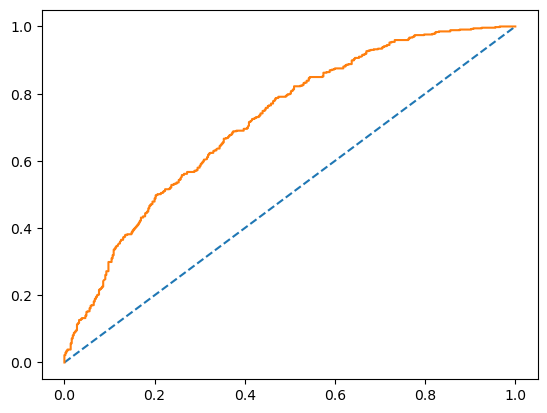

In [950]:
# predict probabilities
probs = model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

In [951]:
model.score(X_test, y_test)

0.6483253588516746

AUC: 0.718


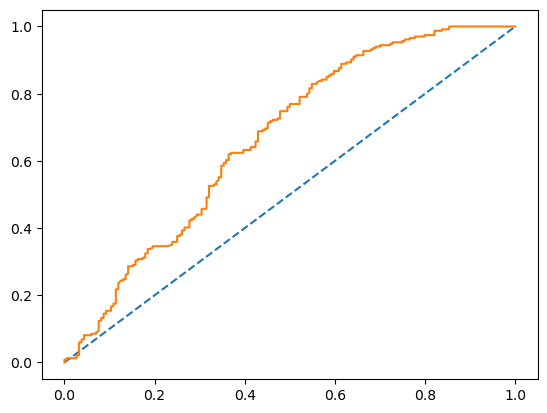

In [952]:
# predict probabilities
probs = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

In [953]:
confusion_matrix(y_train, ytrain_predict)

array([[228, 202],
       [116, 429]], dtype=int64)

In [989]:
cm = confusion_matrix(y_train, ytrain_predict)
cm

array([[228, 202],
       [115, 430]], dtype=int64)

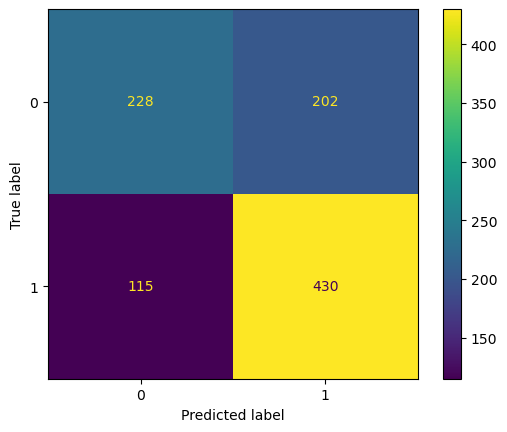

In [990]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [991]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.66      0.53      0.59       430
           1       0.68      0.79      0.73       545

    accuracy                           0.67       975
   macro avg       0.67      0.66      0.66       975
weighted avg       0.67      0.67      0.67       975



In [956]:
confusion_matrix(y_test, ytest_predict)

array([[ 85,  99],
       [ 48, 186]], dtype=int64)

In [992]:
cm = confusion_matrix(y_test, ytest_predict)
cm

array([[ 85,  99],
       [ 48, 186]], dtype=int64)

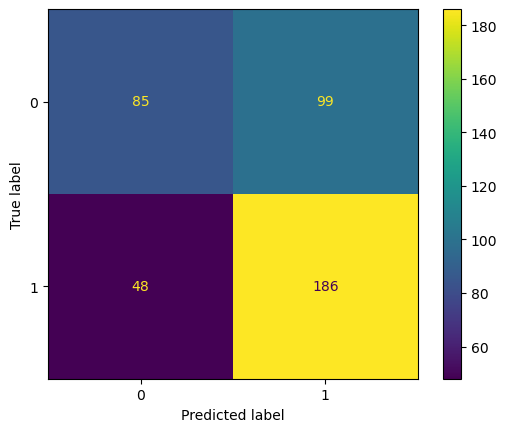

In [993]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [994]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.64      0.46      0.54       184
           1       0.65      0.79      0.72       234

    accuracy                           0.65       418
   macro avg       0.65      0.63      0.63       418
weighted avg       0.65      0.65      0.64       418



In [959]:
grid={'penalty':['l2','none'],
      'solver':['sag','lbfgs'],
      'tol':[0.0001,0.00001]}

In [960]:
model= LogisticRegression(max_iter=400,n_jobs=2)

In [961]:
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 3,n_jobs=-1,scoring='f1')

In [962]:
grid_search.fit(X_train, y_train)


C:\Users\THANUSRI\anaconda31\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=400, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l2', 'none'], 'solver': ['sag', 'lbfgs'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1')

In [963]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'penalty': 'l2', 'solver': 'sag', 'tol': 1e-05} 

LogisticRegression(max_iter=400, n_jobs=2, solver='sag', tol=1e-05)


In [964]:
best_model = grid_search.best_estimator_

In [965]:
ytrain_predict = best_model.predict(X_train)
ytest_predict = best_model.predict(X_test)

In [966]:
ytest_predict_prob=best_model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()


,0,1
0,0.268404,0.731596
1,0.624666,0.375334
2,0.331915,0.668085
3,0.365567,0.634433
4,0.306027,0.693973


In [967]:

print(classification_report(y_train, ytrain_predict),'\n');

              precision    recall  f1-score   support

         0.0       0.66      0.53      0.59       430
         1.0       0.68      0.79      0.73       545

    accuracy                           0.67       975
   macro avg       0.67      0.66      0.66       975
weighted avg       0.67      0.67      0.67       975
 



In [995]:
cm = confusion_matrix(y_train, ytrain_predict)
cm

array([[228, 202],
       [115, 430]], dtype=int64)

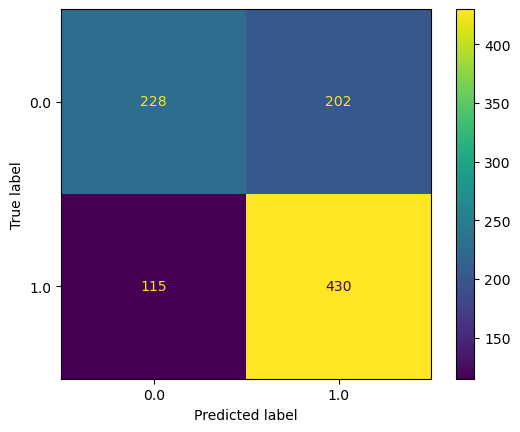

In [996]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()

              precision    recall  f1-score   support

           0       0.64      0.46      0.54       184
           1       0.65      0.79      0.72       234

    accuracy                           0.65       418
   macro avg       0.65      0.63      0.63       418
weighted avg       0.65      0.65      0.64       418
 



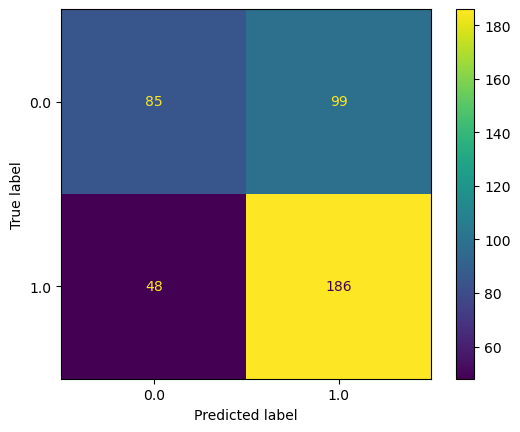

In [997]:
## Confusion matrix on the test data
cm = confusion_matrix(y_test, ytest_predict)
cm
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()
print(classification_report(y_test, ytest_predict),'\n');

In [970]:
Specifty= (85/(85+99))

In [971]:
print(Specifty)

0.46195652173913043


# LDA

In [972]:
cmd_3= cmd.copy()

In [973]:
cmd_3.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,1.0,2.0,3.0,1.0,0.0,2.0,2.0,1.0,0
1,45.0,0.0,2.0,10.0,1.0,0.0,3.0,3.0,1.0,0
2,43.0,1.0,2.0,7.0,1.0,0.0,3.0,3.0,1.0,0
3,42.0,2.0,1.0,9.0,1.0,0.0,3.0,2.0,1.0,0
4,36.0,2.0,2.0,8.0,1.0,0.0,3.0,1.0,1.0,0


In [974]:
X= cmd_3.drop("Contraceptive_method_used" , axis=1)
y= cmd_3.pop("Contraceptive_method_used")

In [975]:
from sklearn import metrics,model_selection

In [976]:
X_train,X_test,y_train,y_test= model_selection.train_test_split(X,y,test_size=0.30,random_state=1,stratify = y)

In [977]:
print('Number of rows and columns of the training set for the independent variables:',X_train.shape)
print('Number of rows and columns of the training set for the dependent variable:',y_train.shape)
print('Number of rows and columns of the test set for the independent variables:',X_test.shape)
print('Number of rows and columns of the test set for the dependent variable:',y_test.shape)

Number of rows and columns of the training set for the independent variables: (975, 9)
Number of rows and columns of the training set for the dependent variable: (975,)
Number of rows and columns of the test set for the independent variables: (418, 9)
Number of rows and columns of the test set for the dependent variable: (418,)


In [978]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [979]:
clf= LinearDiscriminantAnalysis()
model=clf.fit(X_train,y_train)
model

LinearDiscriminantAnalysis()

In [980]:
clf.intercept_

array([-0.67133942])

In [981]:
clf.coef_

array([[-7.10680959e-02,  5.60975886e-01,  6.93257323e-02,
         3.12163468e-01,  3.98128552e-15, -1.63112756e-01,
         1.44856377e-01,  3.50587041e-01,  0.00000000e+00]])

In [982]:
X_train.columns

Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure '],
      dtype='object')

In [983]:
a=clf.coef_
np.round(a,2)

array([[-0.07,  0.56,  0.07,  0.31,  0.  , -0.16,  0.14,  0.35,  0.  ]])

In [984]:
pred_class_train=model.predict(X_train)
pred_class_test= model.predict(X_test)

In [985]:

print(classification_report(y_train, ytrain_predict),'\n');

              precision    recall  f1-score   support

           0       0.66      0.53      0.59       430
           1       0.68      0.79      0.73       545

    accuracy                           0.67       975
   macro avg       0.67      0.66      0.66       975
weighted avg       0.67      0.67      0.67       975
 



In [999]:
cm = confusion_matrix(y_train, ytrain_predict)
cm

array([[228, 202],
       [115, 430]], dtype=int64)

              precision    recall  f1-score   support

           0       0.66      0.53      0.59       430
           1       0.68      0.79      0.73       545

    accuracy                           0.67       975
   macro avg       0.67      0.66      0.66       975
weighted avg       0.67      0.67      0.67       975
 



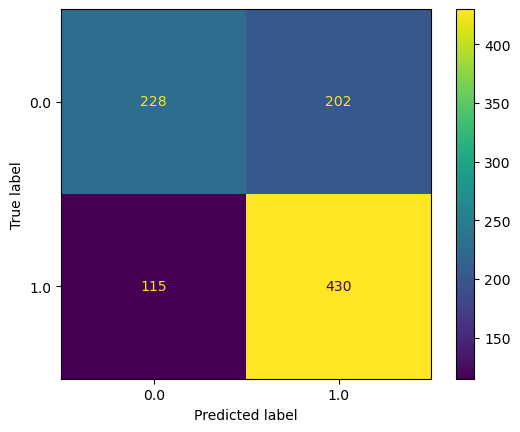

In [1000]:
print(classification_report(y_train, ytrain_predict),'\n');
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()

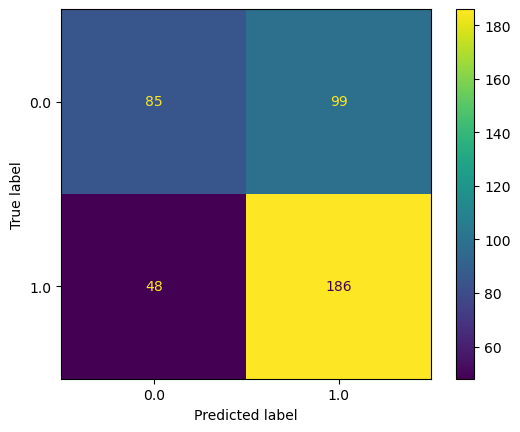

In [1001]:
cm = confusion_matrix(y_test, ytest_predict)
cm
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()

In [988]:
print(classification_report(y_test, ytest_predict),'\n');

              precision    recall  f1-score   support

           0       0.64      0.46      0.54       184
           1       0.65      0.79      0.72       234

    accuracy                           0.65       418
   macro avg       0.65      0.63      0.63       418
weighted avg       0.65      0.65      0.64       418
 

